In [1]:
from src.koopman_probabilistic import KoopmanProb, CoordinateKoopmanProb
from prob_model_objs import NormalNLL, MultiNormalNLL
from src.spectral_and_modes_analysis import plot_modes_stochastic
from quasi_periodic_data import gen_sine, gen_sawtooth, gen_squares, gen_unit_impulse, periodic_normal, periodic_gamma, add_gaus_noise

In [2]:
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt

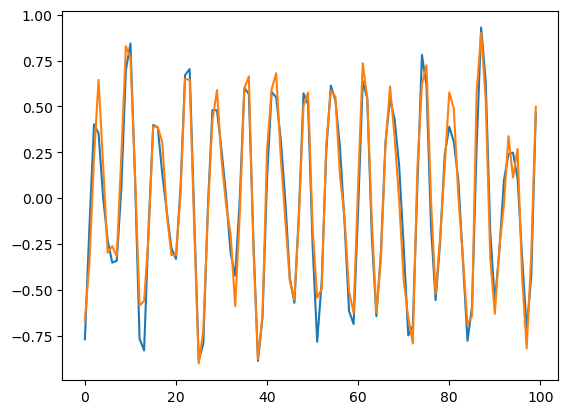

In [3]:
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-100:])

time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)


plt.plot(time_series[-100:])



In [12]:
num_freqs = [3, 3]
num_fourier = 3
model2 = NormalNLL(x_dim=1, num_freqs=num_freqs, n=256)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)


In [13]:
k2.find_fourier_omegas(time_series[:7500])

fourier periods: tensor([ 6.4823,  4.2784, 11.4855], dtype=torch.float64)


tensor([0.9693, 1.4686, 0.5471], dtype=torch.float64)

In [14]:
k2.fit(time_series[:7500], iterations=4000, verbose=True, interval=20, weight_decay=1e-7, lr_theta=3e-3, lr_omega=1e-5, training_mask=None);

Iteration  0
tensor([ 6.4823,  4.2784, 11.4855,  6.4823,  4.2784, 11.4855])
Setting periods to tensor([ 6.4823,  4.2784, 11.4855,  6.4823,  4.2784, 11.4855],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.9693, 1.4686, 0.5471, 0.9693, 1.4686, 0.5471], requires_grad=True)
Loss:  1.2057998102075886
Iteration  1
tensor([ 6.4823,  4.2784, 11.4855,  6.4823,  4.2784, 11.4855])
Setting periods to tensor([ 6.4823,  4.2784, 11.4855,  6.4823,  4.2784, 11.4855],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.9693, 1.4686, 0.5471, 0.9693, 1.4686, 0.5471], requires_grad=True)
Loss:  -0.12179586756378397
Iteration  2
tensor([ 6.4823,  4.2784, 11.4855,  6.4823,  4.2784, 11.4855])
Setting periods to tensor([ 6.4823,  4.2783, 11.4855,  6.4823,  4.2784, 11.4854],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.9693, 1.4686, 0.5471, 0.9693, 1.4686, 0.5471], requires_grad=True)
Loss:  -0.2476349469797415
I

KeyboardInterrupt: 

In [20]:
def MAE(x, x_hat):
    assert len(x) == len(x_hat)
    return np.sum(np.abs(x - x_hat)) / len(x)

In [21]:
def MAPE(x, x_hat):
    assert len(x) == len(x_hat)
    return np.mean(np.abs(x - x_hat) / x)

In [15]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2


In [16]:

mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

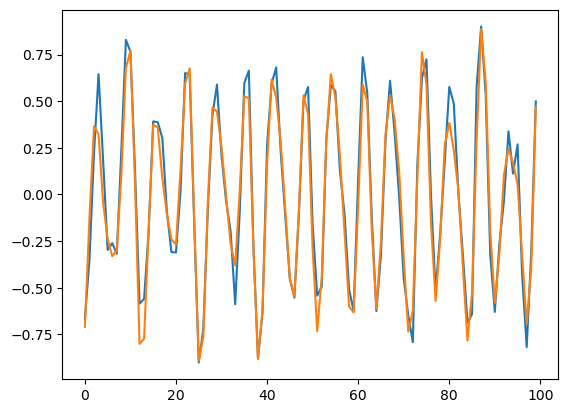

In [18]:
plt.plot(time_series[9900:10000])
plt.plot(mu_hat[9900:10000])

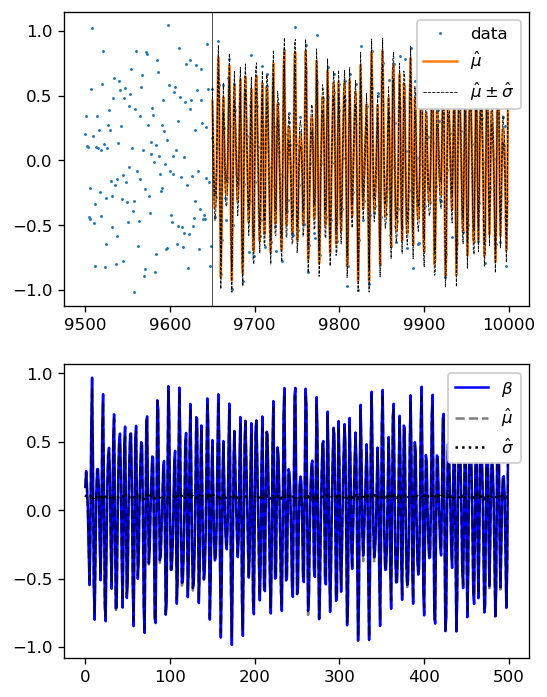

In [24]:
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 9500
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[9500:], time_series[9500:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)

plt.plot(time_series_mu[9500:10000], "b", label="$\\beta$")
plt.plot(mu_hat[9500:], "--k", label="$\hat \\mu$", alpha=0.5)

plt.plot(sigma_hat[9500:], ":k", label="$\hat \\sigma$")
plt.legend(loc="upper right", framealpha=1)

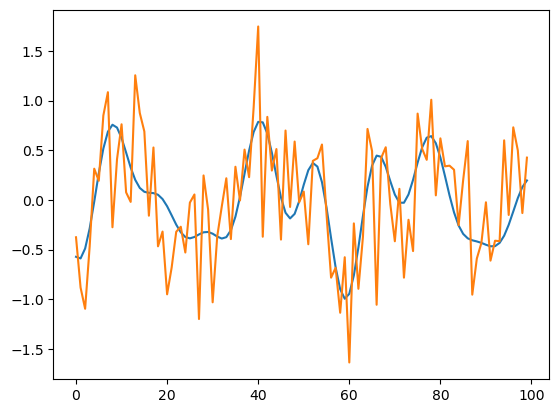

In [25]:
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-100:])

time_series = add_gaus_noise(time_series_mu, sigma=0.5).reshape(-1,1)


plt.plot(time_series[-100:])


In [26]:
num_freqs = [3, 3]
num_fourier = 3
model2 = NormalNLL(x_dim=1, num_freqs=num_freqs, n=256)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

In [27]:
k2.find_fourier_omegas(time_series[:7500])

fourier periods: tensor([32.1888, 14.2045, 11.7371], dtype=torch.float64)


tensor([0.1952, 0.4423, 0.5353], dtype=torch.float64)

In [28]:
k2.fit(time_series[:7500], iterations=1000, verbose=True, interval=20, weight_decay=1e-7, lr_theta=3e-3, lr_omega=1e-5, training_mask=None);

Iteration  0
tensor([32.1888, 14.2045, 11.7371, 32.1888, 14.2045, 11.7371])
Setting periods to tensor([32.1890, 14.2045, 11.7371, 32.1888, 14.2045, 11.7371],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.1952, 0.4423, 0.5353, 0.1952, 0.4423, 0.5353], requires_grad=True)
Loss:  1.135902225282395
Iteration  1
tensor([32.1890, 14.2045, 11.7371, 32.1888, 14.2045, 11.7371])
Setting periods to tensor([32.1896, 14.2045, 11.7370, 32.1889, 14.2046, 11.7371],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.1952, 0.4423, 0.5353, 0.1952, 0.4423, 0.5353], requires_grad=True)
Loss:  0.1515310088634293
Iteration  2
tensor([32.1896, 14.2045, 11.7370, 32.1889, 14.2046, 11.7371])
Setting periods to tensor([32.1879, 14.2040, 11.7366, 32.1889, 14.2045, 11.7371],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.1952, 0.4424, 0.5354, 0.1952, 0.4423, 0.5353], requires_grad=True)
Loss:  0.013704222825114881
Ite

In [30]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

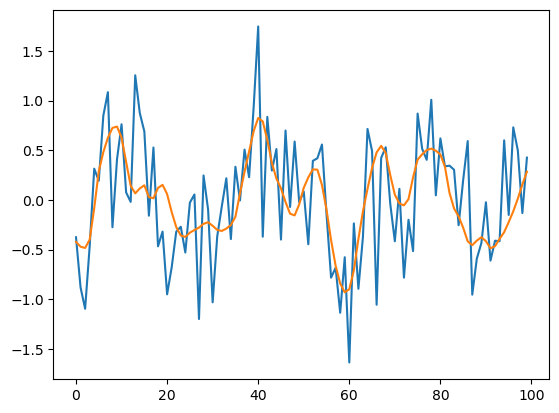

In [31]:
plt.plot(time_series[9900:10000])
plt.plot(mu_hat[9900:10000])

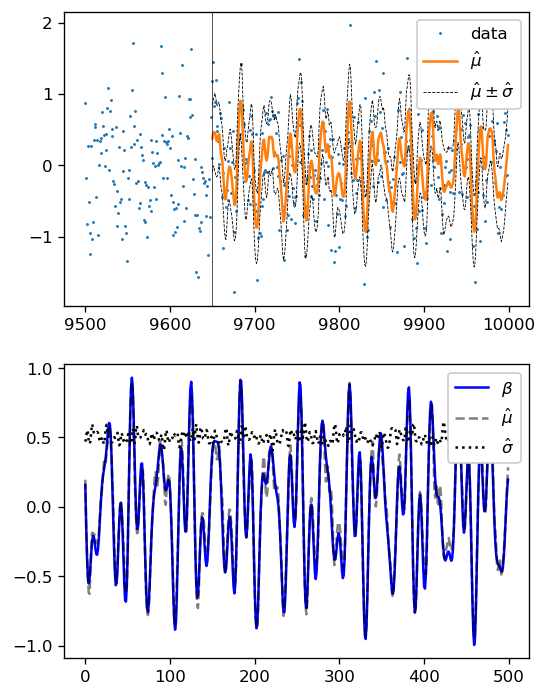

In [32]:
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 9500
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[9500:], time_series[9500:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)

plt.plot(time_series_mu[9500:10000], "b", label="$\\beta$")
plt.plot(mu_hat[9500:], "--k", label="$\hat \\mu$", alpha=0.5)

plt.plot(sigma_hat[9500:], ":k", label="$\hat \\sigma$")
plt.legend(loc="upper right", framealpha=1)

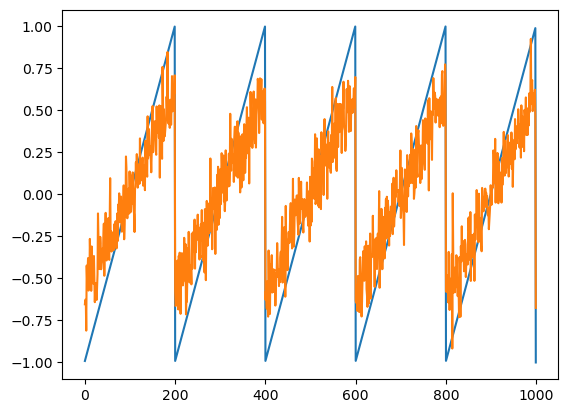

In [33]:
time_series_mu = gen_sawtooth(10000, 50)
plt.plot(time_series_mu[-1000:])
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series /= time_series.max()
plt.plot(time_series[-1000:])

In [34]:
num_freqs = [5, 5]
num_fourier = 5
model2 = NormalNLL(x_dim=1, num_freqs=num_freqs, n=256)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)
k2.find_fourier_omegas(time_series[:7500])
k2.fit(time_series[:7500].reshape(-1,1), iterations=3000, verbose=True, interval=20, cutoff=3000, weight_decay=1e-7, lr_theta=1e-4, lr_omega=1e-4, training_mask=None);

fourier periods: tensor([202.7027, 101.3514,  66.9643,  50.3356,  40.1070], dtype=torch.float64)
Iteration  0
tensor([202.7027, 101.3514,  66.9643,  50.3356,  40.1070, 202.7027, 101.3514,
         66.9643,  50.3356,  40.1070])
Setting periods to tensor([202.7011, 101.3516,  66.9643,  50.3356,  40.1069, 202.6983, 101.3429,
         66.9615,  50.3385,  40.1067], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.0310, 0.0620, 0.0938, 0.1248, 0.1567, 0.0310, 0.0620, 0.0938, 0.1248,
        0.1567], requires_grad=True)
Loss:  1.9822039677726
Iteration  1
tensor([202.7011, 101.3516,  66.9643,  50.3356,  40.1069, 202.6983, 101.3429,
         66.9615,  50.3385,  40.1067])
Setting periods to tensor([202.6995, 101.3519,  66.9642,  50.3357,  40.1069, 202.6909, 101.3347,
         66.9582,  50.3417,  40.1066], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.0310, 0.0620, 0.0938, 0.1248, 0.1567, 0.0310, 0.0620, 0.0938, 0.1248,
        0.1567], requir

KeyboardInterrupt: 

In [35]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2

In [36]:
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

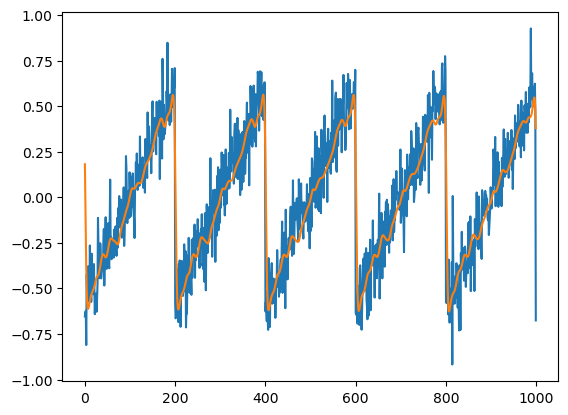

In [38]:
plt.plot(time_series[9000:10000])
plt.plot(mu_hat[9000:10000])

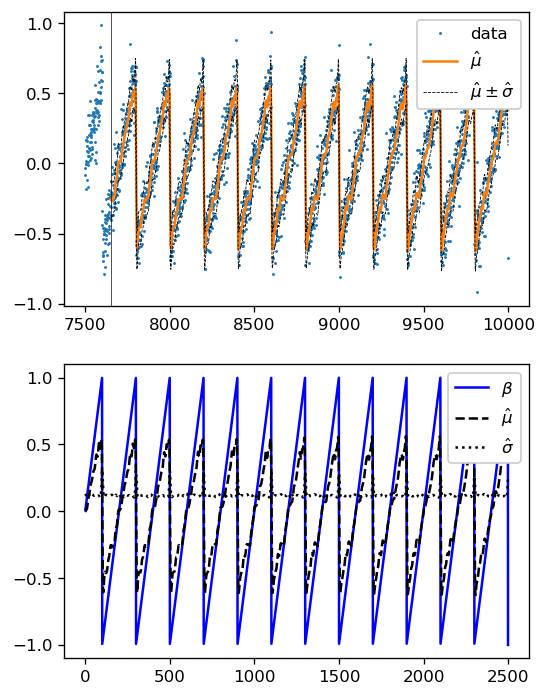

In [41]:
plt.plot(mu_hat[9900:10000])
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 7500
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[7500:], time_series[7500:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)


plt.plot(time_series_mu[7500:10000], "b", label="$\\beta$")
plt.plot(mu_hat[7500:], "--k", label="$\hat \\mu$")
plt.plot(sigma_hat[7500:], ":k", label="$\hat \\sigma$")

plt.legend(loc="upper right", framealpha=1)

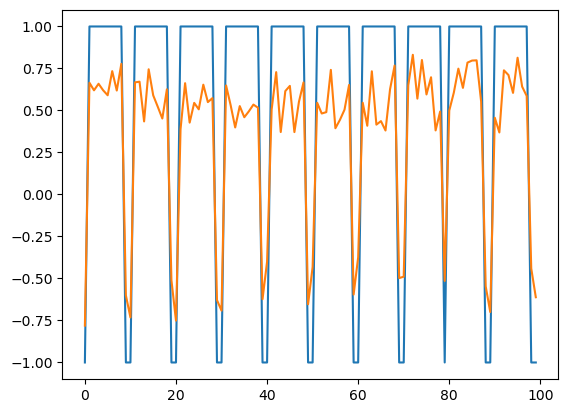

In [51]:
time_series_mu = gen_squares(10000, 50)
plt.plot(time_series_mu[-100:])
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series /= time_series.max()
plt.plot(time_series[-100:])

In [52]:
num_freqs = [5, 5]
num_fourier = 5
model2 = NormalNLL(x_dim=1, num_freqs=num_freqs, n=256)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)
k2.find_fourier_omegas(time_series[:7500])
k2.fit(time_series[:7500].reshape(-1,1), iterations=3000, verbose=True, interval=20, cutoff=3000, weight_decay=1e-7, lr_theta=1e-4, lr_omega=1e-4, training_mask=None);

fourier periods: tensor([2.4777e+00, 4.9570e+00, 9.9206e+00, 3.7500e+03, 4.3605e+00],
       dtype=torch.float64)
Iteration  0
tensor([2.4777e+00, 4.9570e+00, 9.9206e+00, 3.7500e+03, 4.3605e+00, 2.4777e+00,
        4.9570e+00, 9.9206e+00, 3.7500e+03, 4.3605e+00])
Setting periods to tensor([2.4777e+00, 4.9570e+00, 9.9206e+00, 3.7505e+03, 4.3605e+00, 2.4777e+00,
        4.9570e+00, 9.9207e+00, 3.8285e+03, 4.3605e+00],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([2.5359e+00, 1.2675e+00, 6.3335e-01, 1.6753e-03, 1.4409e+00, 2.5359e+00,
        1.2675e+00, 6.3334e-01, 1.6411e-03, 1.4409e+00], requires_grad=True)
Loss:  1.783922697396879
Iteration  1
tensor([2.4777e+00, 4.9570e+00, 9.9206e+00, 3.7505e+03, 4.3605e+00, 2.4777e+00,
        4.9570e+00, 9.9207e+00, 3.8285e+03, 4.3605e+00])
Setting periods to tensor([2.4777e+00, 4.9570e+00, 9.9206e+00, 3.7511e+03, 4.3605e+00, 2.4777e+00,
        4.9570e+00, 9.9208e+00, 3.8692e+03, 4.3605e+00],
       grad_fn=<MulBa

KeyboardInterrupt: 

In [53]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

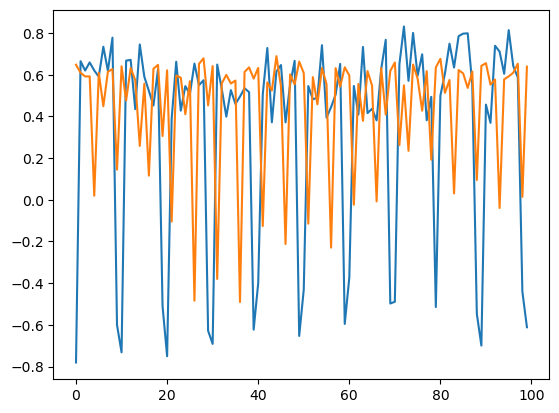

In [54]:
plt.plot(time_series[9900:10000])
plt.plot(mu_hat[9900:10000])

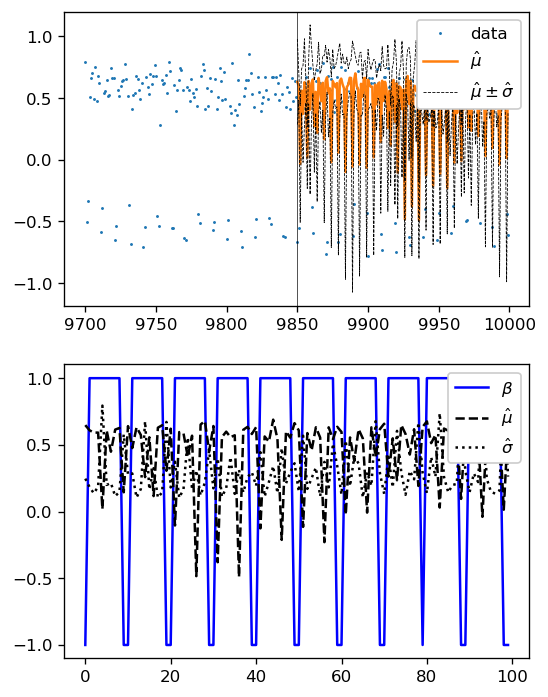

In [55]:
plt.plot(mu_hat[9900:10000])
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 9700
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[9700:], time_series[9700:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)


plt.plot(time_series_mu[9900:10000], "b", label="$\\beta$")
plt.plot(mu_hat[9900:], "--k", label="$\hat \\mu$")
plt.plot(sigma_hat[9900:], ":k", label="$\hat \\sigma$")

plt.legend(loc="upper right", framealpha=1)

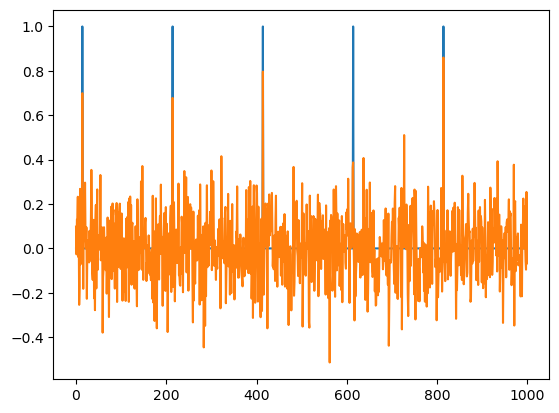

In [57]:
time_series_mu = gen_unit_impulse(10000, 50)
plt.plot(time_series_mu[-1000:])
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series /= time_series.max()
plt.plot(time_series[-1000:])

In [58]:
num_freqs = [5, 5]
num_fourier = 5
model2 = NormalNLL(x_dim=1, num_freqs=num_freqs, n=256)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)
k2.find_fourier_omegas(time_series[:7500])
k2.fit(time_series[:7500].reshape(-1,1), iterations=2000, verbose=True, interval=20, cutoff=3000, weight_decay=1e-7, lr_theta=1e-4, lr_omega=1e-4, training_mask=None);

fourier periods: tensor([ 2.1515, 67.5676,  3.4499,  4.6526,  4.1667], dtype=torch.float64)
Iteration  0
tensor([ 2.1515, 67.5676,  3.4499,  4.6526,  4.1667,  2.1515, 67.5676,  3.4499,
         4.6526,  4.1667])
Setting periods to tensor([ 2.1515, 67.5678,  3.4499,  4.6526,  4.1667,  2.1515, 67.5666,  3.4499,
         4.6526,  4.1667], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([2.9204, 0.0930, 1.8213, 1.3505, 1.5080, 2.9204, 0.0930, 1.8213, 1.3505,
        1.5080], requires_grad=True)
Loss:  2.0768638725037447
Iteration  1
tensor([ 2.1515, 67.5678,  3.4499,  4.6526,  4.1667,  2.1515, 67.5666,  3.4499,
         4.6526,  4.1667])
Setting periods to tensor([ 2.1515, 67.5681,  3.4499,  4.6526,  4.1667,  2.1515, 67.5655,  3.4499,
         4.6526,  4.1667], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([2.9204, 0.0930, 1.8213, 1.3505, 1.5080, 2.9204, 0.0930, 1.8213, 1.3505,
        1.5080], requires_grad=True)
Loss:  2.054682524247143
Ite

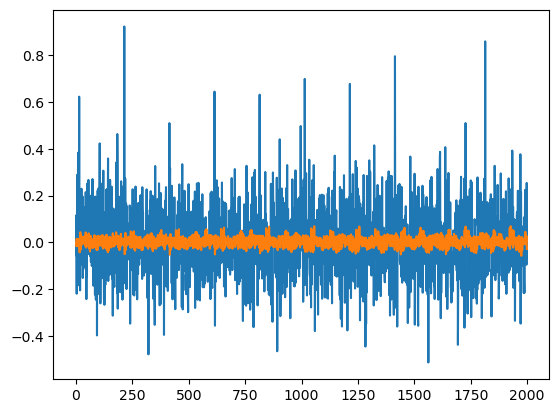

In [61]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

plt.plot(time_series[8000:10000])
plt.plot(mu_hat[8000:10000])

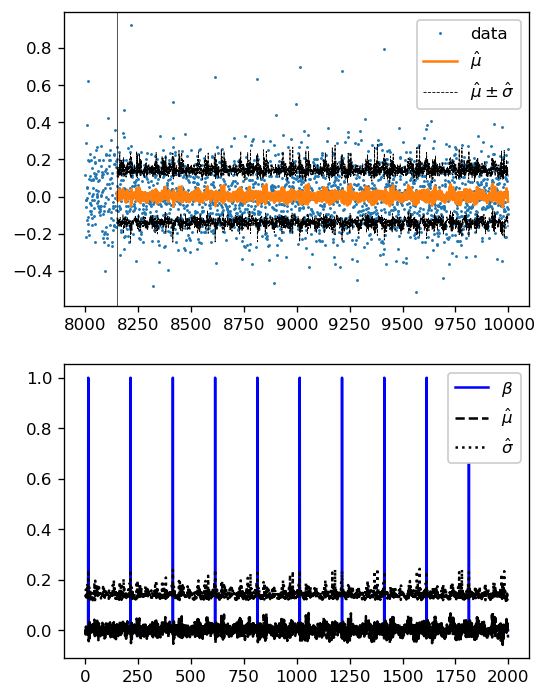

In [63]:
plt.plot(mu_hat[8000:10000])
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 8000
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[8000:], time_series[8000:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)


plt.plot(time_series_mu[8000:10000], "b", label="$\\beta$")
plt.plot(mu_hat[8000:], "--k", label="$\hat \\mu$")
plt.plot(sigma_hat[8000:], ":k", label="$\hat \\sigma$")

plt.legend(loc="upper right", framealpha=1)

In [1]:
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-500:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)


plt.plot(time_series[-500:], label='ts with noise')
plt.legend()

NameError: name 'gen_sine' is not defined

In [4]:
num_freqs = [3, 3]
num_fourier = 3
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = KoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

In [13]:
k2.find_fourier_omegas(time_series[:7500])
k2.fit(time_series[:7500].reshape(-1,1), iterations=2000, verbose=True, interval=20, cutoff=3000, weight_decay=1e-7, lr_theta=1e-4, lr_omega=1e-4, training_mask=None);

fourier periods: tensor([14.5068, 28.6260,  8.7311, 12.7551,  3.0157], dtype=torch.float64)
Iteration  0
tensor([14.5068, 28.6260,  8.7311, 12.7551,  3.0157, 14.5068, 28.6260,  8.7311,
        12.7551,  3.0157])
Setting periods to tensor([14.4907, 28.5638,  8.7294, 12.7553,  3.0157, 14.5064, 28.6226,  8.7311,
        12.7551,  3.0157], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.4336, 0.2200, 0.7198, 0.4926, 2.0835, 0.4331, 0.2195, 0.7196, 0.4926,
        2.0835], requires_grad=True)
Loss:  -0.6616828732410225
Iteration  1
tensor([14.4907, 28.5638,  8.7294, 12.7553,  3.0157, 14.5064, 28.6226,  8.7311,
        12.7551,  3.0157])
Setting periods to tensor([14.4907, 28.5611,  8.7291, 12.7555,  3.0157, 14.5064, 28.6237,  8.7311,
        12.7551,  3.0157], grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.4336, 0.2200, 0.7198, 0.4926, 2.0835, 0.4331, 0.2195, 0.7196, 0.4926,
        2.0835], requires_grad=True)
Loss:  -0.8043611250364269


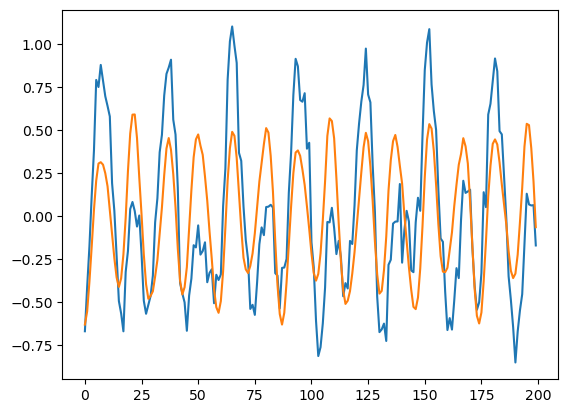

In [14]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

plt.plot(time_series[9800:10000])
plt.plot(mu_hat[9800:10000])

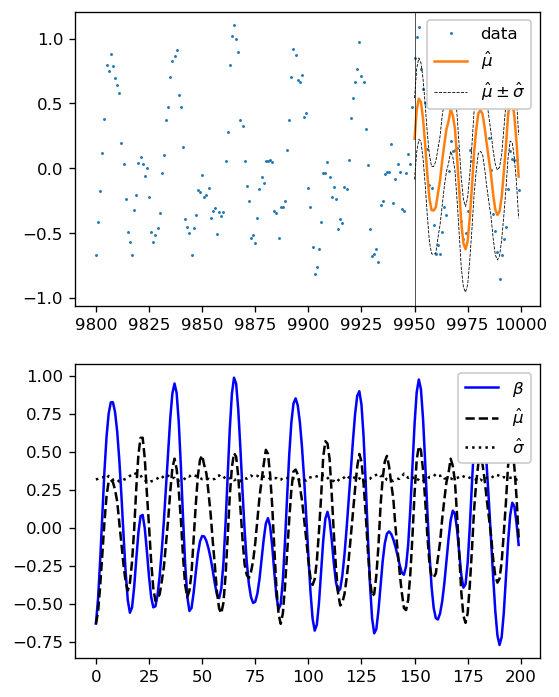

In [15]:
plt.plot(mu_hat[9800:10000])
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 9800
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[9800:], time_series[9800:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)


plt.plot(time_series_mu[9800:10000], "b", label="$\\beta$")
plt.plot(mu_hat[9800:], "--k", label="$\hat \\mu$")
plt.plot(sigma_hat[9800:], ":k", label="$\hat \\sigma$")

plt.legend(loc="upper right", framealpha=1)

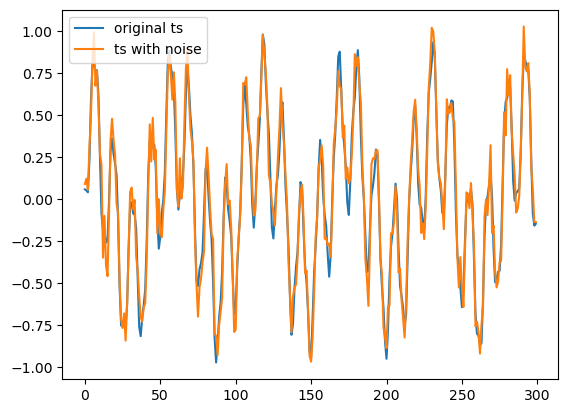

In [3]:
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-300:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)


plt.plot(time_series[-300:], label='ts with noise')
plt.legend()

In [4]:
num_freqs = [3, 3]
num_fourier = 3
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
k2.fit(time_series[:7500].reshape(-1,1), iterations=1000, verbose=True, interval=20, cutoff=3000, weight_decay=1e-7, lr_theta=1e-3, lr_omega=1e-4, training_mask=None);


fourier periods: tensor([12.4378, 57.6923,  4.2064], dtype=torch.float64)
Iteration  0
tensor([12.4378, 57.6923,  4.2064, 12.4378, 57.6923,  4.2064])
Setting periods to tensor([12.4378, 57.6926,  4.2064, 12.4378, 57.6919,  4.2064],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.5052, 0.1089, 1.4937, 0.5052, 0.1089, 1.4937], requires_grad=True)
Loss:  1.8372993523630046
Iteration  1
tensor([12.4378, 57.6926,  4.2064, 12.4378, 57.6919,  4.2064])
Setting periods to tensor([12.4379, 57.6931,  4.2064, 12.4378, 57.6917,  4.2064],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.5052, 0.1089, 1.4937, 0.5052, 0.1089, 1.4937], requires_grad=True)
Loss:  1.4760740395361591
Iteration  2
tensor([12.4379, 57.6931,  4.2064, 12.4378, 57.6917,  4.2064])
Setting periods to tensor([12.4378, 57.6944,  4.2064, 12.4378, 57.6921,  4.2064],
       grad_fn=<MulBackward0>)
Setting omegas to Parameter containing:
tensor([0.5052, 0.1089, 1.4937, 0

In [6]:
for p in k2.model_obj.mlp_mu.parameters():
    print(p)

Parameter containing:
tensor([[ 4846.5068, -2014.6809,  1659.7961,  -709.5005, -1413.0591,  -250.4448]],
       requires_grad=True)
Parameter containing:
tensor([-3545.0437], requires_grad=True)


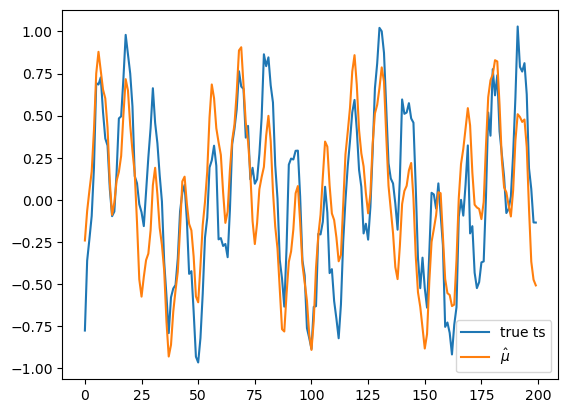

In [6]:
predict_through = 10000
params2 = k2.predict(predict_through)
mu_hat, sigma_hat = params2
mean_hat2 = model2.mean(params2)
std_hat2 = model2.std(params2)

plt.plot(time_series[9800:10000], label='true ts')
plt.plot(mu_hat[9800:10000], label="$\hat \\mu$")
plt.legend()

In [ ]:
plt.plot(mu_hat[9800:10000])
%matplotlib inline
plt.subplots(figsize=(5, 7), dpi=120)
idx = 150 + 9800
plt.subplot(211)
pt = np.arange(10000)
plt.plot(pt[9800:], time_series[9800:10000], ".", markersize=1.5, label="data")
# colors = [(i / len(quantiles), 0, 0) for i in range(len(quantiles))]
# for j in range(0, len(quantiles), 1):
#     plt.plot(pt[idx:], quant_preds[idx:, j], color=colors[j], linewidth=0.5, label=quantiles[j])
plt.plot(pt[idx:], mean_hat2[idx:], label="$\hat \mu$")
plt.plot(pt[idx:], mean_hat2[idx:] + std_hat2[idx:], "--k", linewidth=0.5, label="$\hat \mu \pm \hat \sigma$")
plt.plot(pt[idx:], mean_hat2[idx:] - std_hat2[idx:], "--k", linewidth=0.5)
plt.axvline(idx, color="k", linewidth=0.4)
plt.legend(loc="upper right", framealpha=1)
plt.subplot(212)


plt.plot(time_series_mu[9800:10000], "b", label="$\\beta$")
plt.plot(mu_hat[9800:], "--k", label="$\hat \\mu$")
plt.plot(sigma_hat[9800:], ":k", label="$\hat \\sigma$")

plt.legend(loc="upper right", framealpha=1)

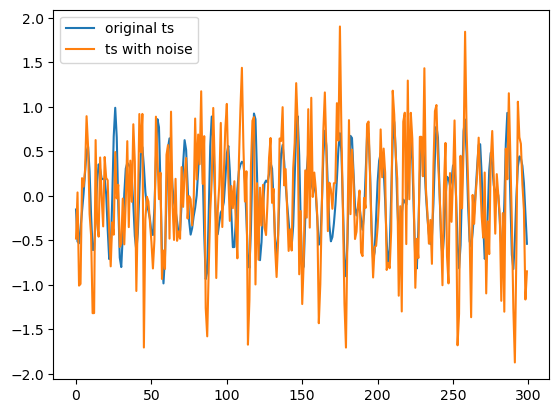

In [3]:
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-300:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.5).reshape(-1,1)
plt.plot(time_series[-300:], label='ts with noise')
plt.legend()

fourier periods: tensor([ 9.2822,  5.7826,  7.0489,  3.2134, 56.8182], dtype=torch.float64)
Loss at iteration 10: -0.08129016595217141
Loss at iteration 60: -0.1725542623103622
Loss at iteration 110: -0.1884394066899017
Loss at iteration 160: -0.1888611079000491
Loss at iteration 210: -0.18905219591791483
Loss at iteration 260: -0.18921505068154726
Loss at iteration 310: -0.1893630378443732
Loss at iteration 360: -0.1895143657337568
Loss at iteration 410: -0.1896896793604381
Loss at iteration 460: -0.18984556668688454
Loss at iteration 510: -0.1900001661864184
Loss at iteration 560: -0.19018226588923487
Loss at iteration 610: -0.19031505179821462
Loss at iteration 660: -0.1904066705880893
Loss at iteration 710: -0.19049670366455917
Loss at iteration 760: -0.19057871397569667
Loss at iteration 810: -0.190651449295754
Loss at iteration 860: -0.19072976929950947
Loss at iteration 910: -0.19079358392190676
Loss at iteration 960: -0.19085567808210285
Final loss: -0.1909041991413287


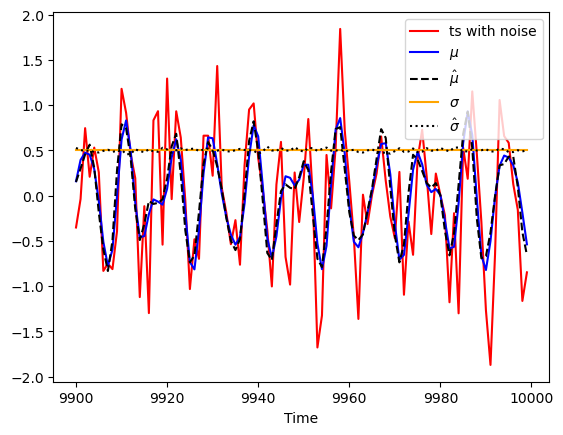

torch.Size([100, 10])


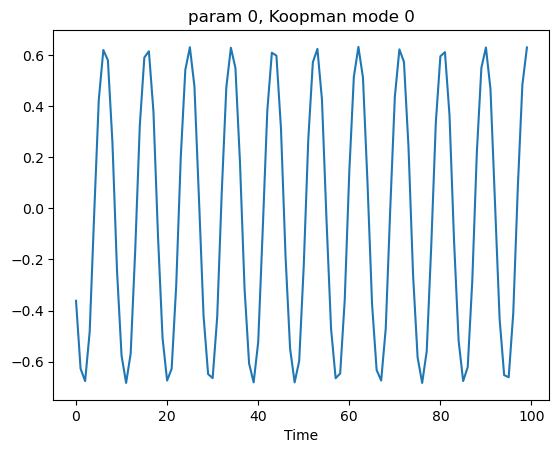

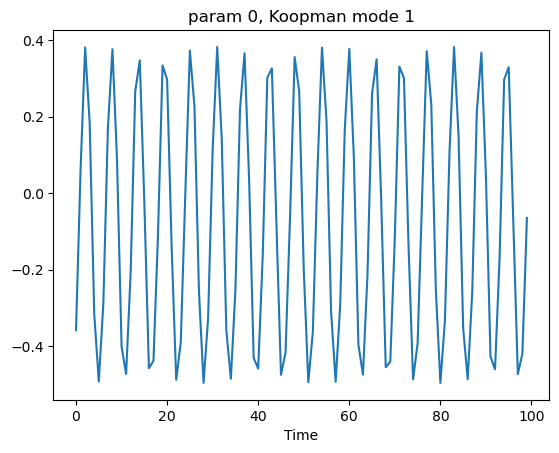

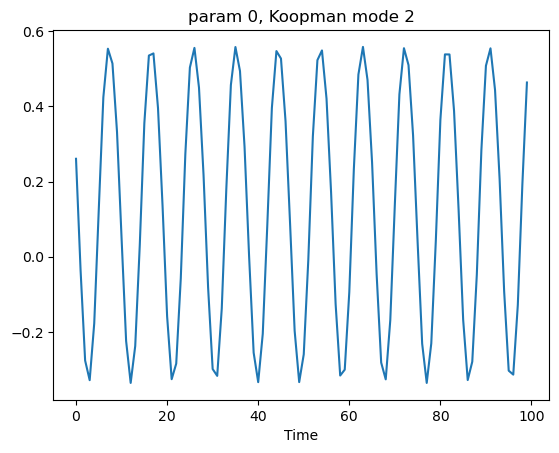

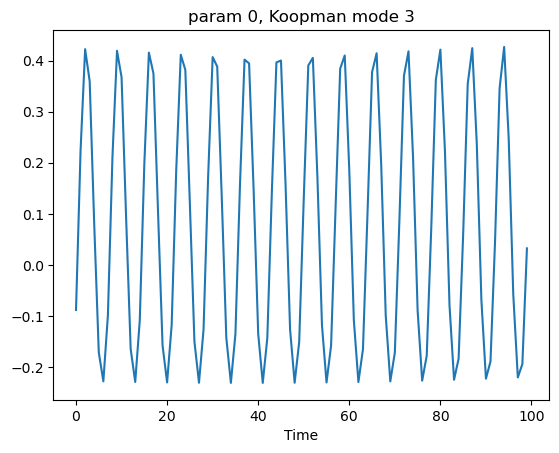

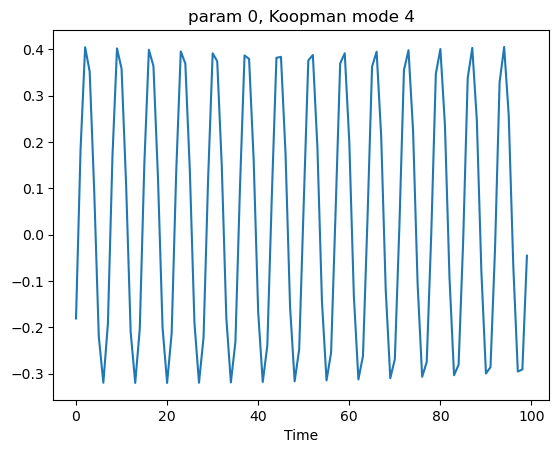

torch.Size([100, 10])


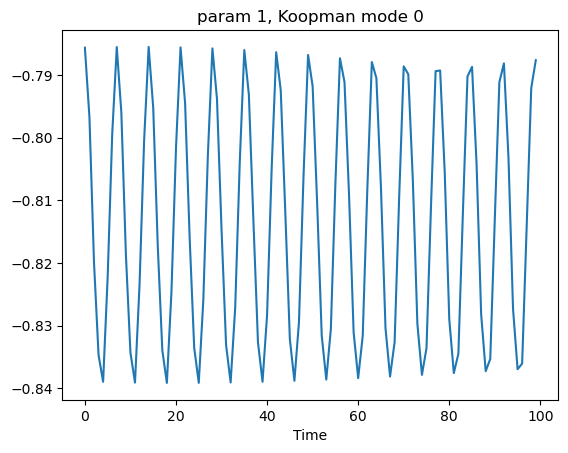

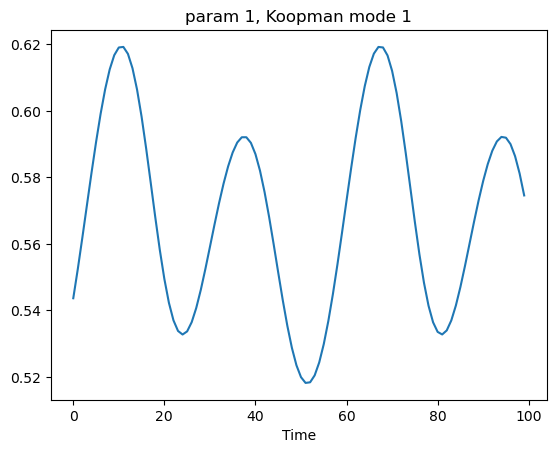

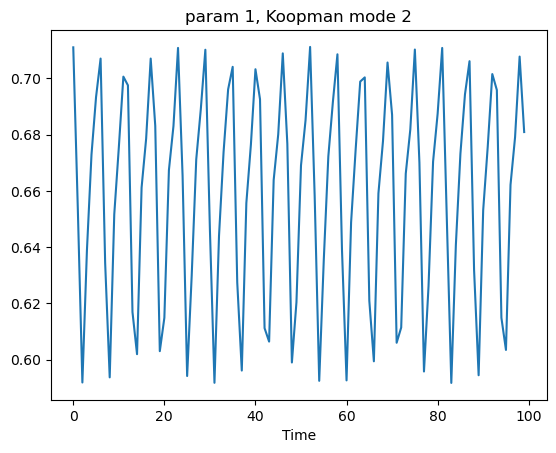

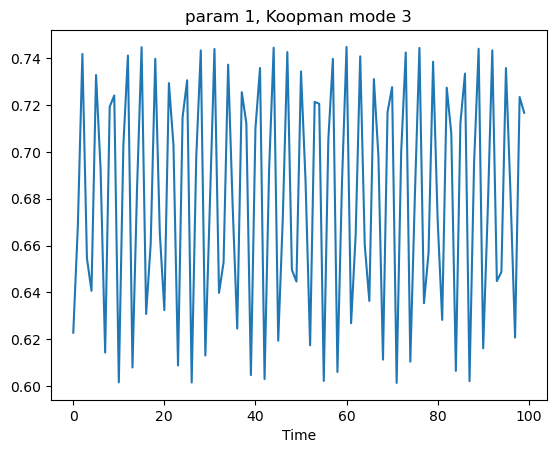

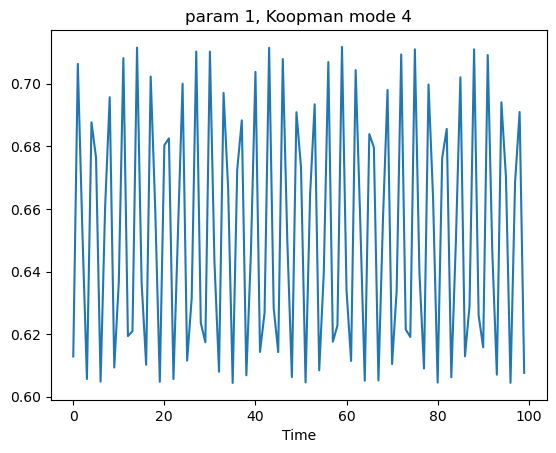

In [4]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.5, num_modes=5, train_ratio=0.75, iterations=1000, plot_n_last=100)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


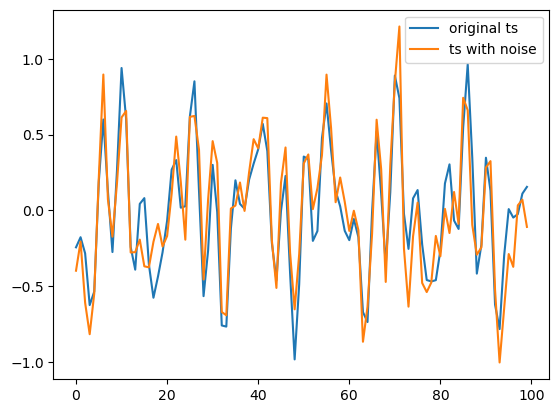

In [6]:
plt.legend(loc="upper right", framealpha=1)
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-100:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1, 1)
plt.plot(time_series[-100:], label='ts with noise')
plt.legend()

fourier periods: tensor([15.2439,  5.0234,  4.0021], dtype=torch.float64)
Loss at iteration 10: -0.43344645640789853
Loss at iteration 60: -1.0908810924778845
Loss at iteration 110: -1.0916363378134166
Loss at iteration 160: -1.091865399728673
Loss at iteration 210: -1.0919976016833284
Loss at iteration 260: -1.0920795111275943
Loss at iteration 310: -1.0921588994060554
Loss at iteration 360: -1.092215611595355
Loss at iteration 410: -1.0922645201881467
Loss at iteration 460: -1.0923070533014394
Loss at iteration 510: -1.0923550095838102
Loss at iteration 560: -1.0924051709528624
Loss at iteration 610: -1.0924478546344223
Loss at iteration 660: -1.0924936578847646
Loss at iteration 710: -1.0925278148663922
Loss at iteration 760: -1.092566158647651
Loss at iteration 810: -1.0926027541432197
Loss at iteration 860: -1.0926377202792865
Loss at iteration 910: -1.0926727652212318
Loss at iteration 960: -1.0927034605965267
Final loss: -1.0927290642507208


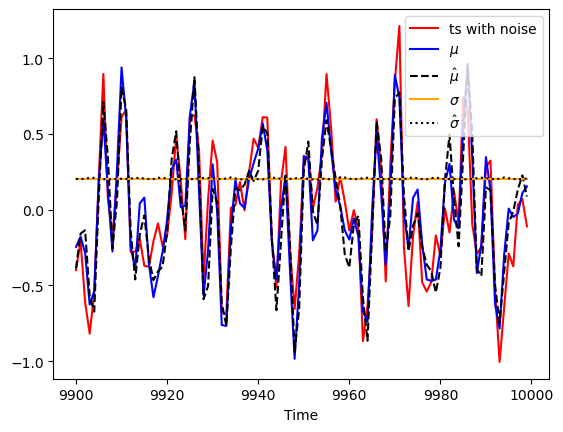

torch.Size([100, 6])


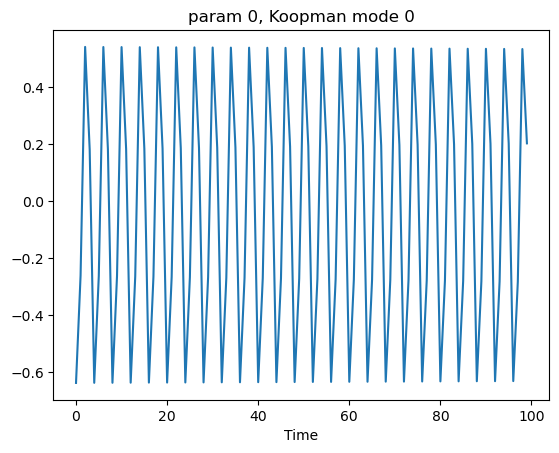

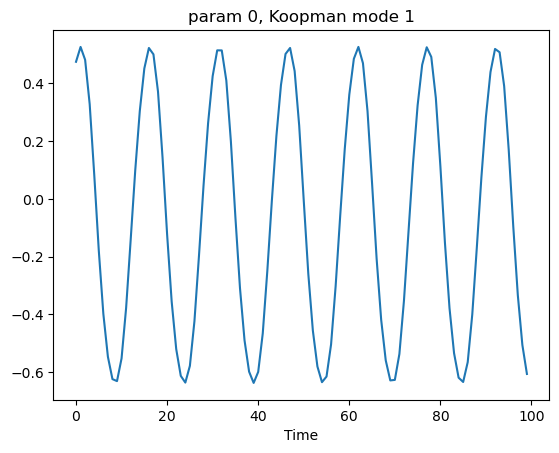

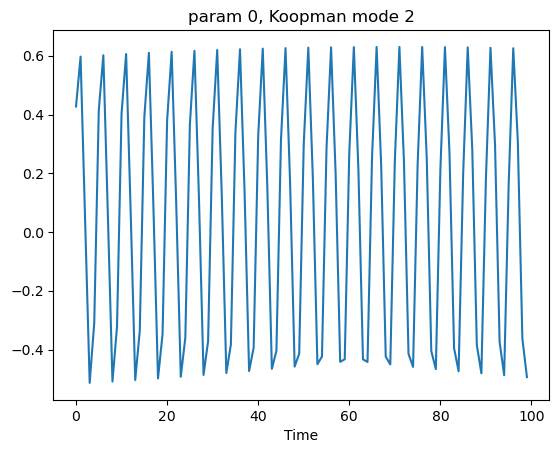

torch.Size([100, 6])


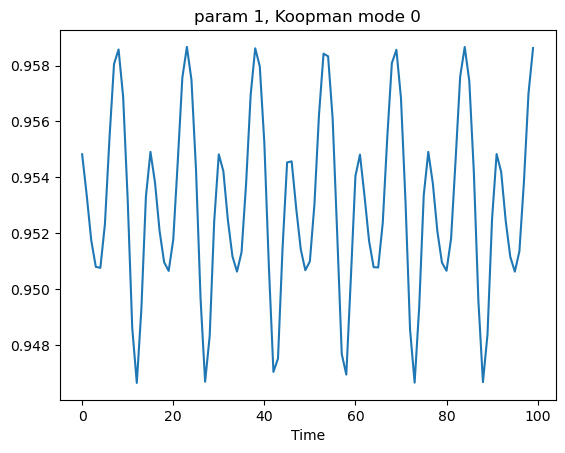

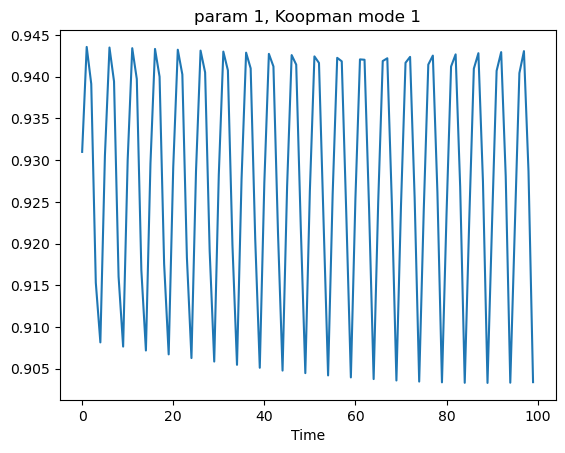

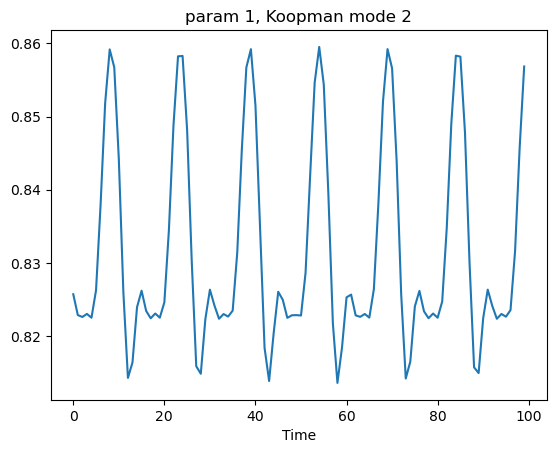

In [8]:
num_freqs = [3, 3]
num_fourier = 3
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75, iterations=1000, plot_n_last=100)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


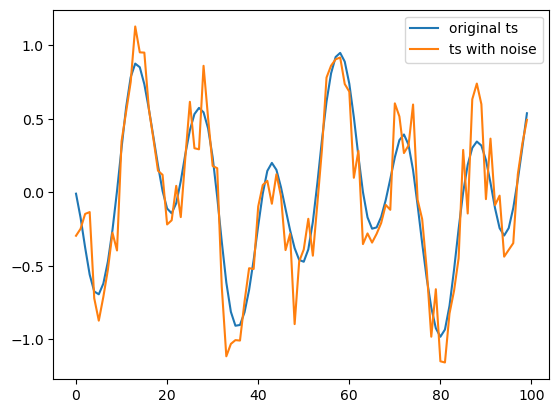

In [28]:
plt.legend(loc="upper right", framealpha=1)
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-100:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1, 1)
plt.plot(time_series[-100:], label='ts with noise')
plt.legend()

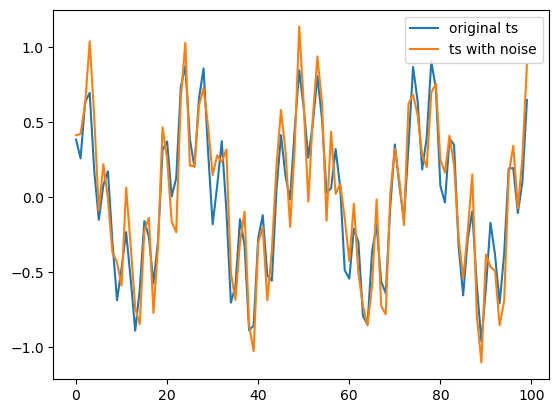

In [48]:
np.random.seed(42)
time_series_mu = gen_sine(10000, 3)
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-100:], label='original ts')

time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1, 1)
plt.plot(time_series[-100:], label='ts with noise')
plt.legend()

fourier periods: tensor([25.6849,  4.2088, 28.6260, 17.6056, 22.6586], dtype=torch.float64)
Loss at iteration 10: -0.852618562777315
Loss at iteration 60: -1.0154097053584472
Loss at iteration 110: -1.0166098745832204
Loss at iteration 160: -1.0173210574785785
Loss at iteration 210: -1.017908789624792
Loss at iteration 260: -1.01842936434375
Loss at iteration 310: -1.0189755455412646
Loss at iteration 360: -1.0194997532344552
Loss at iteration 410: -1.0200650430853808
Loss at iteration 460: -1.020619901510402
Loss at iteration 510: -1.0211639617216028
Loss at iteration 560: -1.0217167602045716
Loss at iteration 610: -1.0222550104854136
Loss at iteration 660: -1.0227214955727113
Loss at iteration 710: -1.023184140005334
Loss at iteration 760: -1.0236103370472487
Loss at iteration 810: -1.0239494784029541
Loss at iteration 860: -1.0242851777898143
Loss at iteration 910: -1.0245630342163585
Loss at iteration 960: -1.0247882478815087
Final loss: -1.0249720250466643


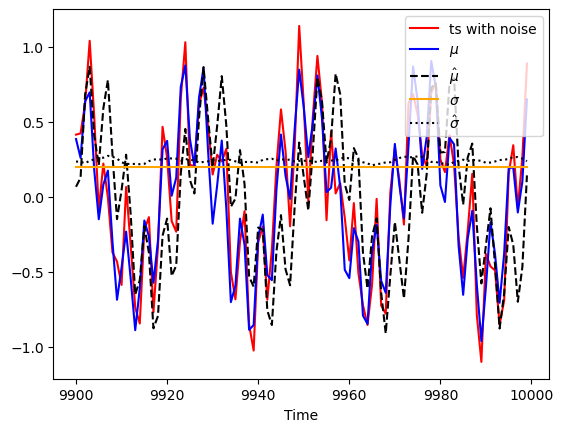

torch.Size([100, 10])


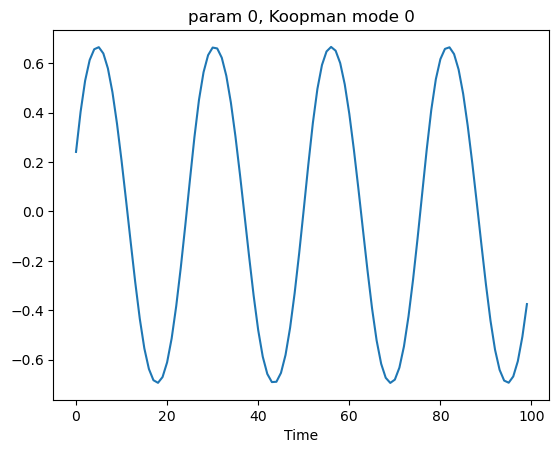

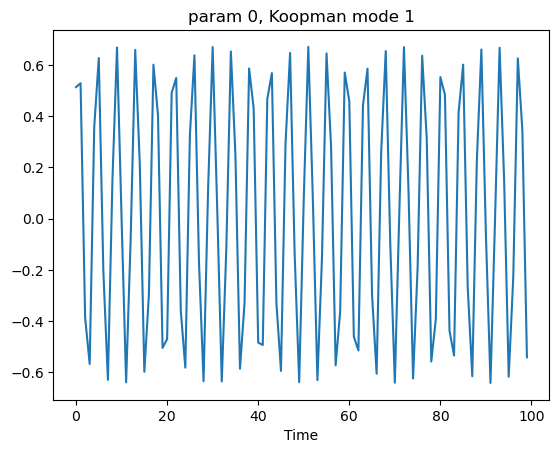

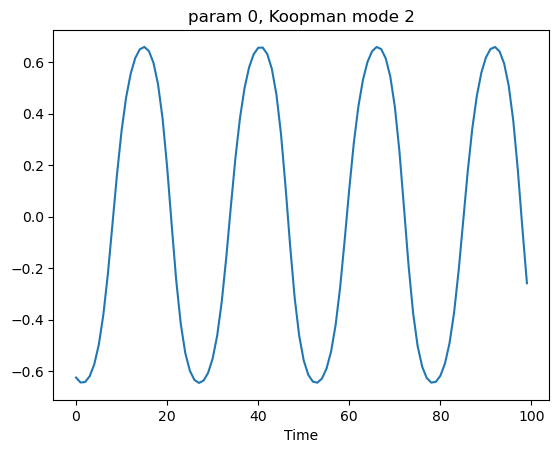

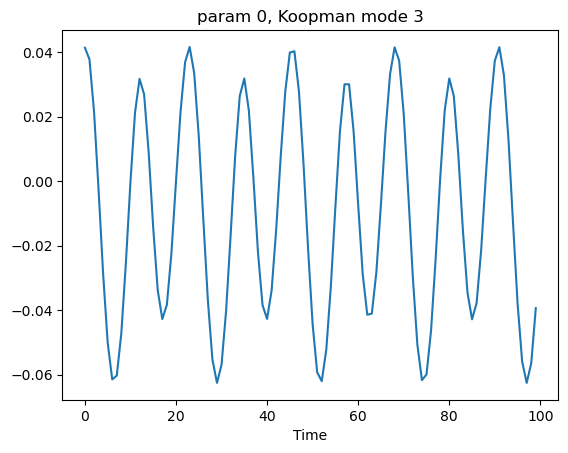

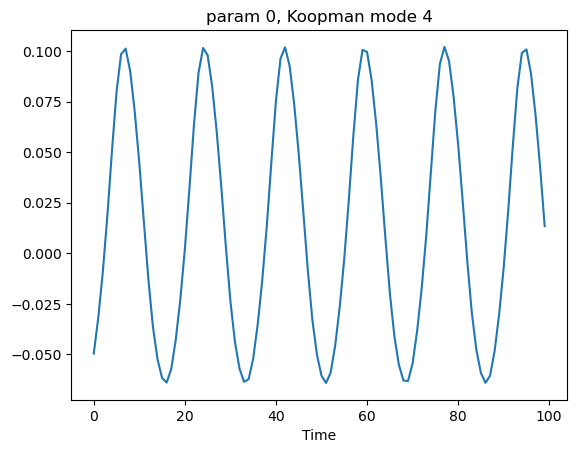

torch.Size([100, 10])


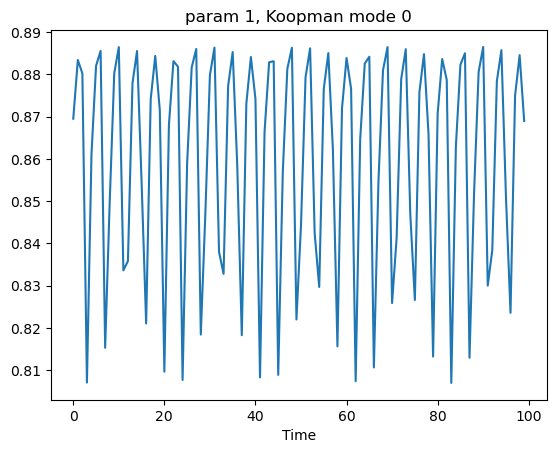

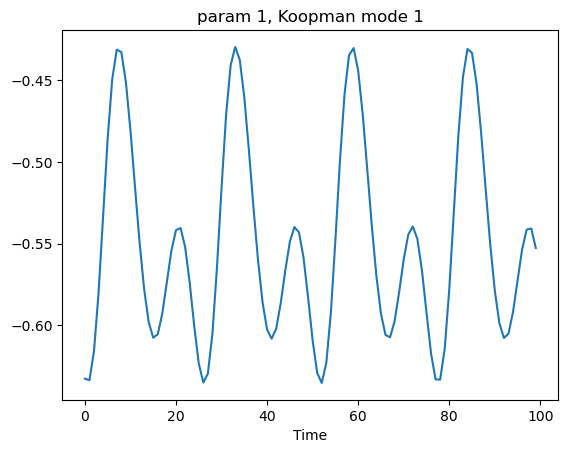

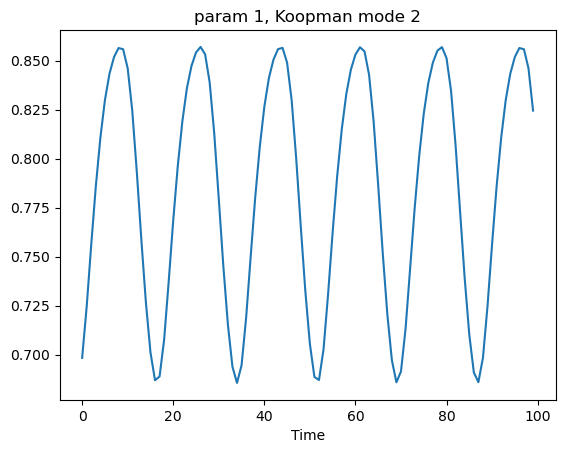

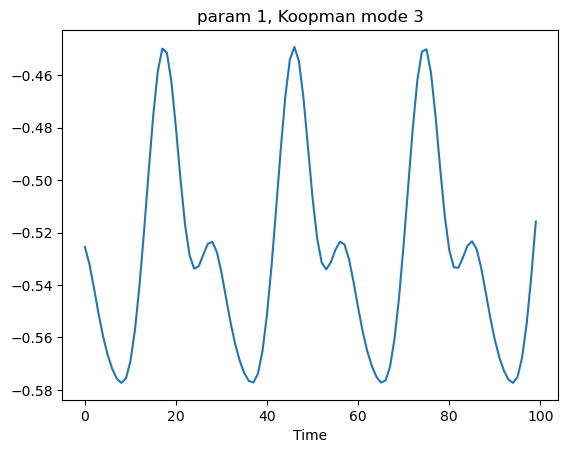

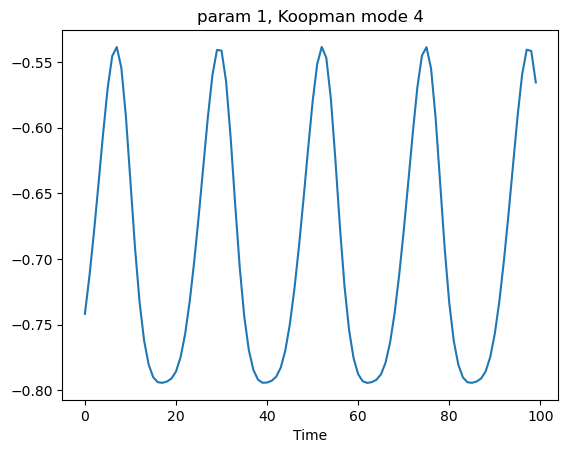

In [49]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=5, train_ratio=0.75, iterations=1000, plot_n_last=100)

fourier periods: tensor([14.8810, 41.4365,  6.0096], dtype=torch.float64)
Loss at iteration 10: -0.6813090000836926
Loss at iteration 60: -1.0504939116583012
Loss at iteration 110: -1.051264423255522
Loss at iteration 160: -1.051559427559912
Loss at iteration 210: -1.052112096784712
Loss at iteration 260: -1.0529741299311979
Loss at iteration 310: -1.0538822246310404
Loss at iteration 360: -1.0547296424126655
Loss at iteration 410: -1.0552909222396656
Loss at iteration 460: -1.055917780915382
Loss at iteration 510: -1.0565096316549445
Loss at iteration 560: -1.057096591331537
Loss at iteration 610: -1.0576052550493096
Loss at iteration 660: -1.0580694244322688
Loss at iteration 710: -1.0584046772747555
Loss at iteration 760: -1.0587418901446006
Loss at iteration 810: -1.0590724765260373
Loss at iteration 860: -1.059320968684227
Loss at iteration 910: -1.0597649863738263
Loss at iteration 960: -1.060055429659009
Final loss: -1.060188241889834


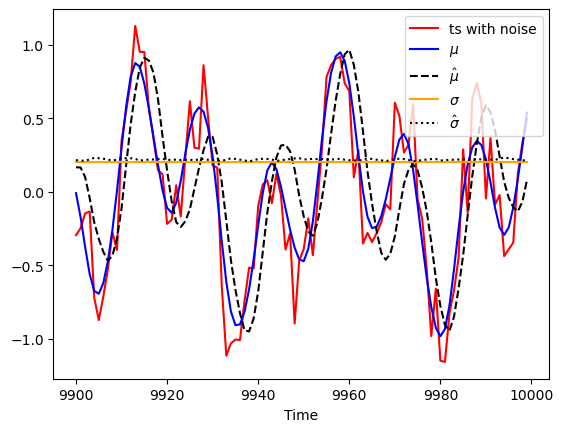

torch.Size([100, 6])


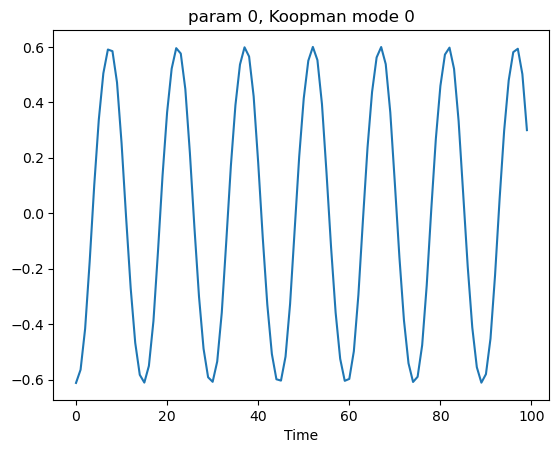

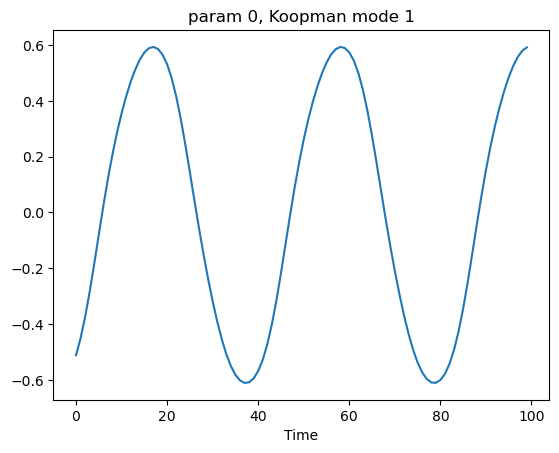

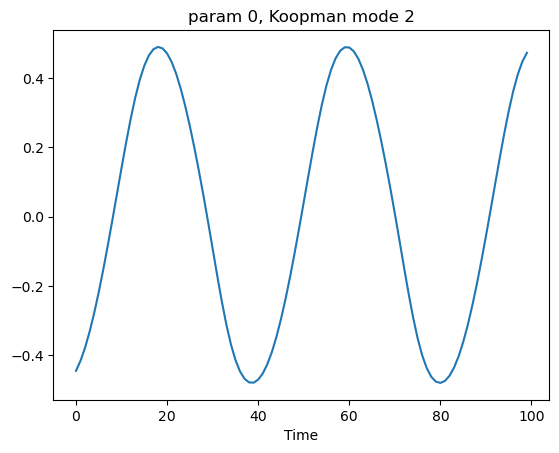

torch.Size([100, 6])


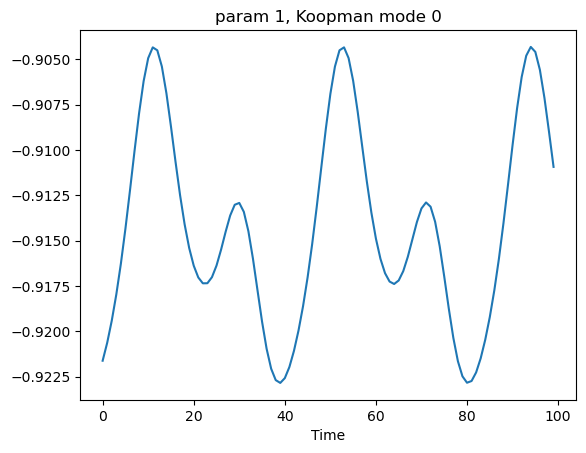

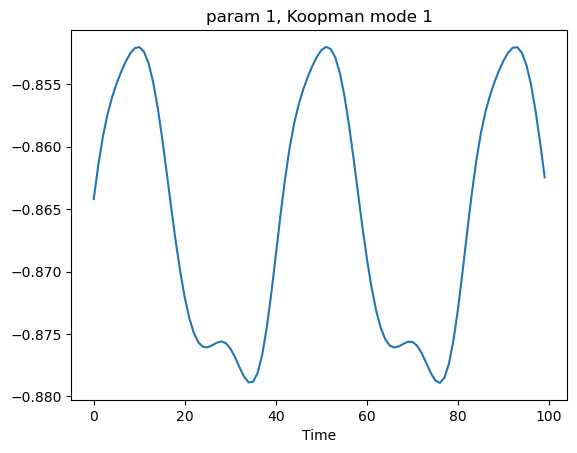

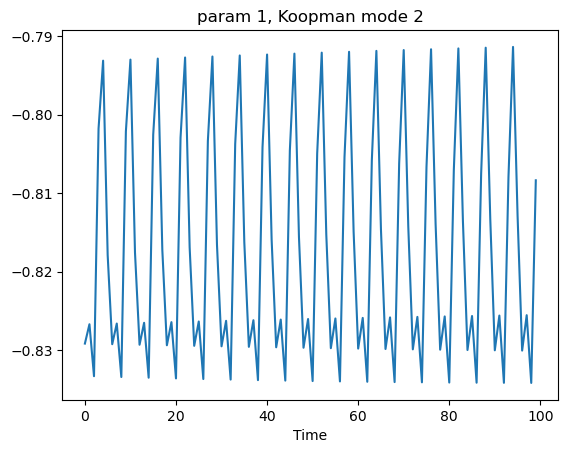

In [29]:
num_freqs = [3, 3]
num_fourier = 3
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75, iterations=1000, plot_n_last=100)

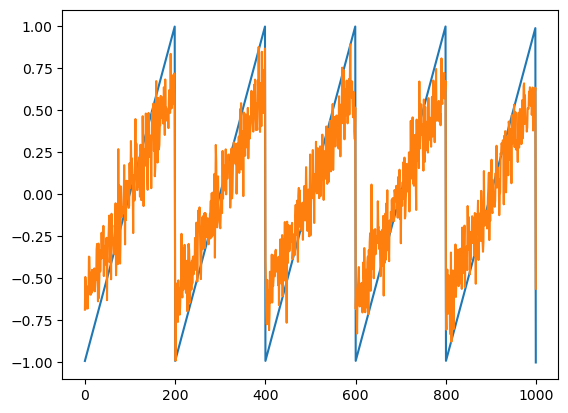

In [3]:
time_series_mu = gen_sawtooth(10000, 50)
plt.plot(time_series_mu[-1000:])
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series /= time_series.max()
plt.plot(time_series[-1000:])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fourier periods: tensor([202.7027, 100.0000,  66.9643], dtype=torch.float64)
Loss at iteration 10: -1.0156369068171118
Loss at iteration 60: -0.9506635458178702
Loss at iteration 110: -1.0567611803141357
Loss at iteration 160: -1.1148011074827495
Loss at iteration 210: -1.0437773606947713
Loss at iteration 260: -1.125493444830708
Loss at iteration 310: -1.0420617714104985
Loss at iteration 360: -1.1151244033587886
Loss at iteration 410: -1.1191759773813752
Loss at iteration 460: -1.0422977367152237
Loss at iteration 510: -1.1110635099848007
Loss at iteration 560: -1.0446759586707988
Loss at iteration 610: -1.059938721069133
Loss at iteration 660: -1.048007292626724
Loss at iteration 710: -0.9632805449717942
Loss at iteration 760: -1.0628505953975864
Loss at iteration 810: -1.0738630974964627
Loss at iteration 860: -1.1109239968676097
Loss at iteration 910: -0.8020523320287513
Loss at iteration 960: -1.0439002058518836
Final loss: -1.0221589129649238


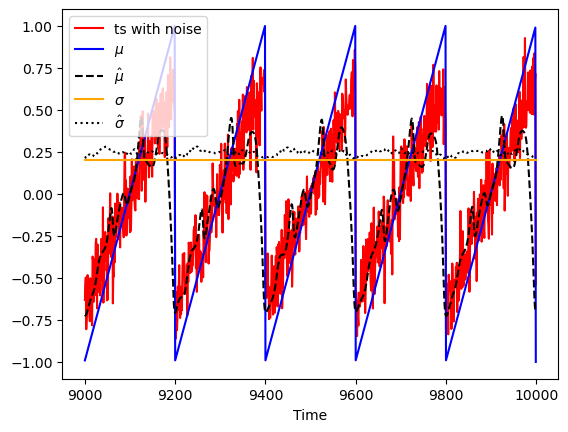

torch.Size([1000, 10])


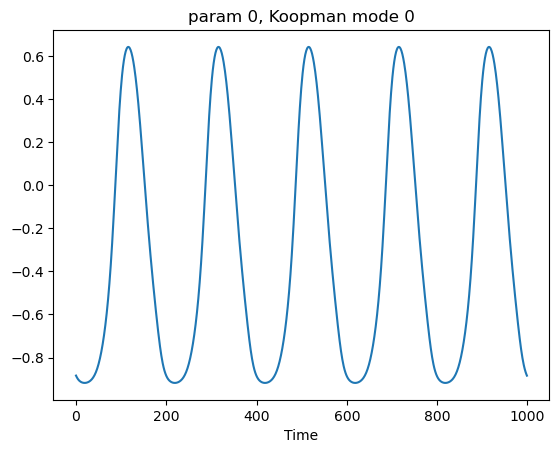

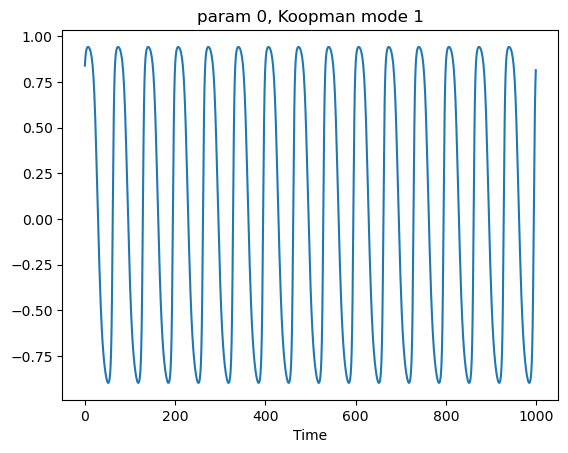

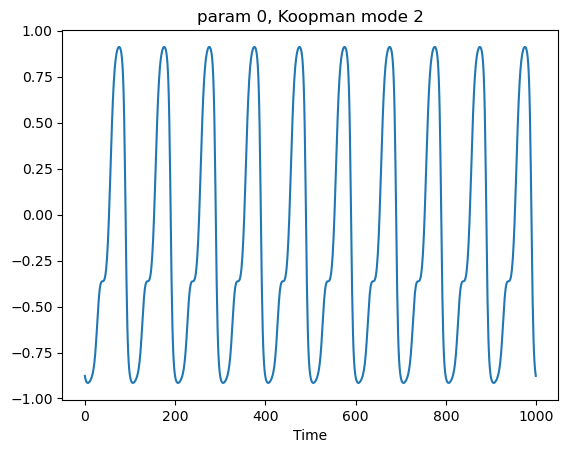

torch.Size([1000, 10])


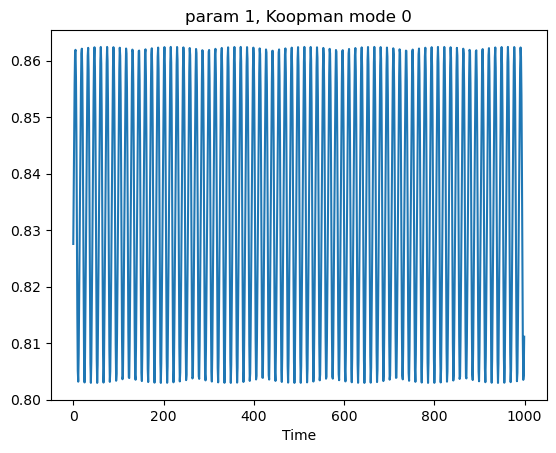

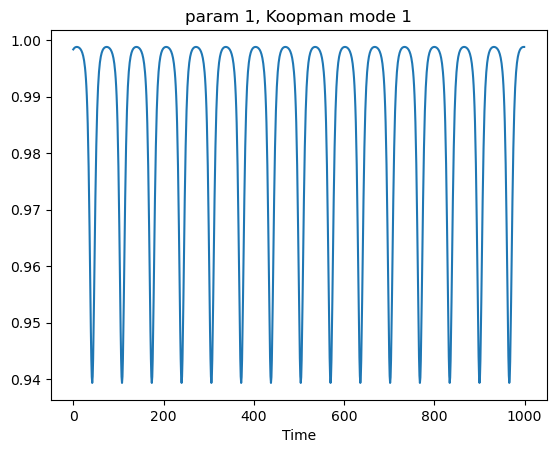

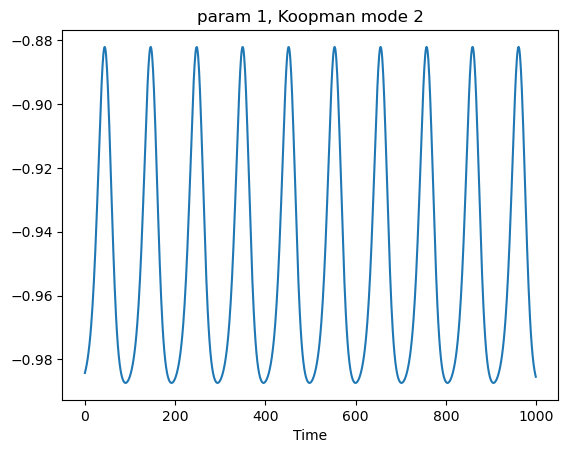

In [31]:
plt.legend()
num_freqs = [5, 5]
num_fourier = 3
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75,
                      iterations=1000, plot_n_last=1000)

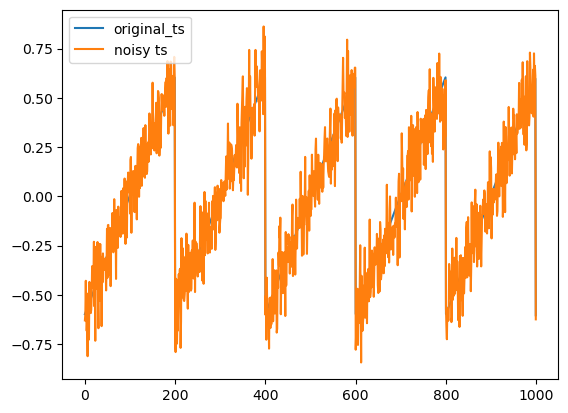

In [3]:
time_series_mu = gen_sawtooth(10000, 50)
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series_mu /= time_series.max()
time_series /= time_series.max()
plt.plot(time_series_mu[-1000:], label='original_ts')
plt.plot(time_series[-1000:], label='noisy ts')
plt.legend();

fourier periods: tensor([202.7027, 101.3514,  66.9643,  40.1070,  50.0000], dtype=torch.float64)
Loss at iteration 10: -0.6467037287530244
Loss at iteration 60: -0.7076256519552714
Loss at iteration 110: -0.7091516326159968
Loss at iteration 160: -0.7093424801932413
Loss at iteration 210: -0.7094057292094833
Loss at iteration 260: -0.7094073080251837
Loss at iteration 310: -0.7094270851260902
Loss at iteration 360: -0.7094843322463373
Loss at iteration 410: -0.7129694841745893
Loss at iteration 460: -1.1054936036972243
Loss at iteration 510: -1.027746030568494
Loss at iteration 560: -1.0450575605633992
Loss at iteration 610: -1.0341373138147476
Loss at iteration 660: -1.0092555317930456
Loss at iteration 710: -1.1176855950545037
Loss at iteration 760: -1.071982012880292
Loss at iteration 810: -0.9295111619412696
Loss at iteration 860: -0.8854092738594771
Loss at iteration 910: -0.9480988293782362
Loss at iteration 960: -1.008608264543339
Final loss: -0.8725987982148109


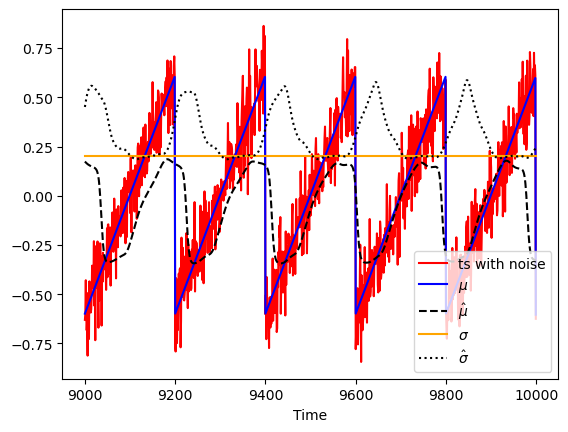

torch.Size([1000, 10])


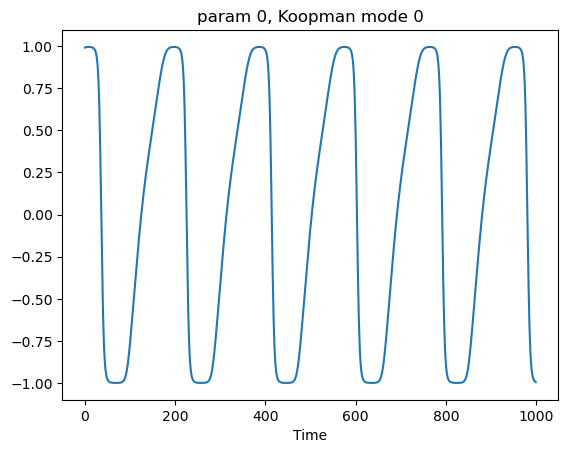

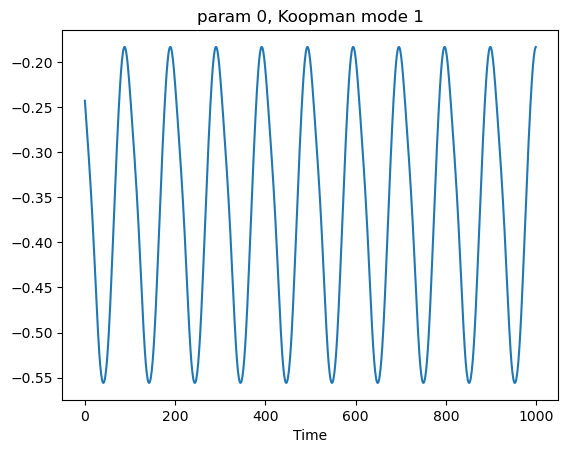

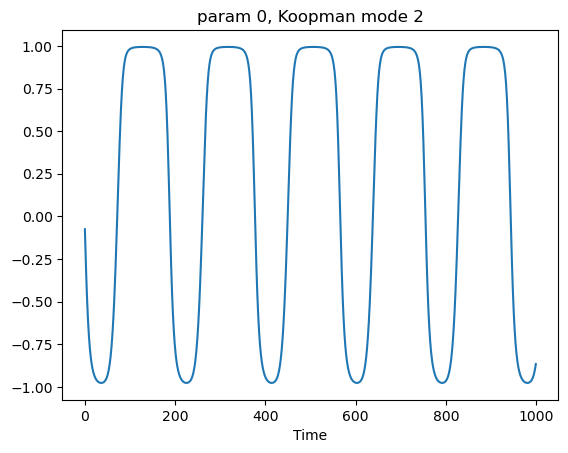

torch.Size([1000, 10])


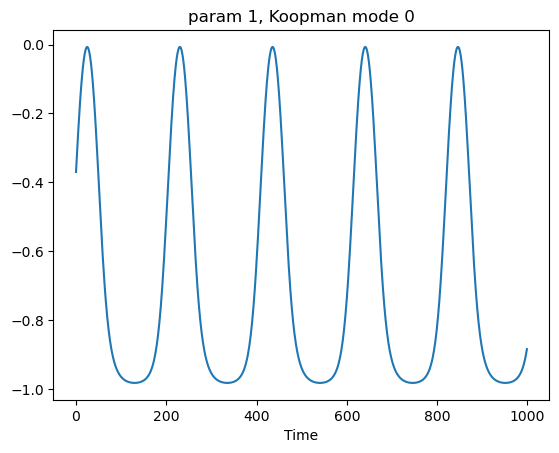

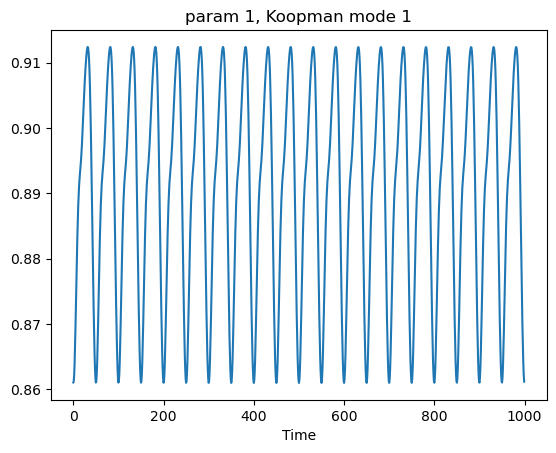

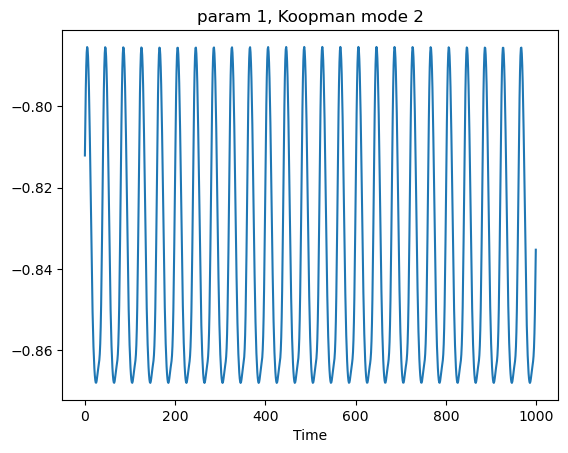

In [4]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, l1_coef=0.3, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75,
                      iterations=1000, plot_n_last=1000)

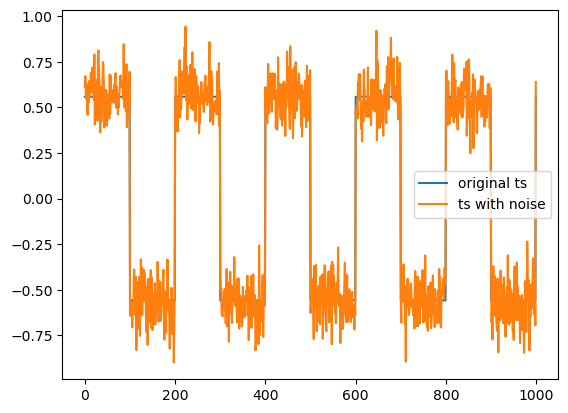

In [44]:
time_series_mu = gen_squares(10000, 50)
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series_mu /= time_series.max()
time_series /= time_series.max()
plt.plot(time_series_mu[-1000:], label='original ts')
plt.plot(time_series[-1000:], label='ts with noise')
plt.legend()

fourier periods: tensor([202.7027,  66.9643,  40.1070,  28.6260, 227.2727], dtype=torch.float64)
Loss at iteration 10: 0.22449007547658564
Loss at iteration 60: -0.1366922180073796
Loss at iteration 110: -0.1291392983130871
Loss at iteration 160: -0.14985169578233806
Loss at iteration 210: -0.15806449088220514
Loss at iteration 260: -0.1607300618500355
Loss at iteration 310: -0.17900158587239423
Loss at iteration 360: -0.194272600217897
Loss at iteration 410: -0.20013935620854864
Loss at iteration 460: -0.2626817190210615
Loss at iteration 510: -0.3024439758518977
Loss at iteration 560: -0.30044950064932513
Loss at iteration 610: -0.431993174155979
Loss at iteration 660: -0.46340728753080535
Loss at iteration 710: -0.574886448382371
Loss at iteration 760: -0.6099270778895746
Loss at iteration 810: -0.5976626480919498
Loss at iteration 860: -0.5820130408427157
Loss at iteration 910: -0.6300554288892306
Loss at iteration 960: -0.6234696867573325
Final loss: -0.6408848460564064


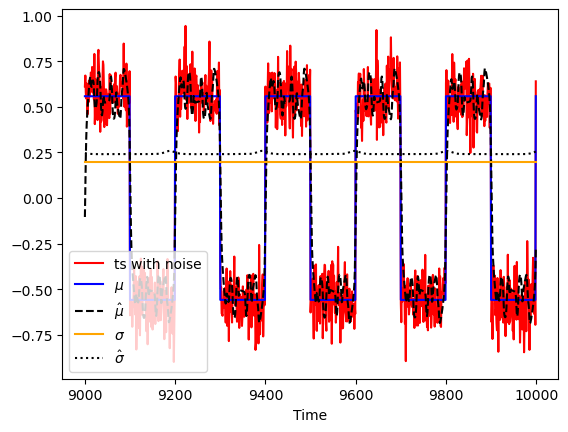

torch.Size([1000, 10])


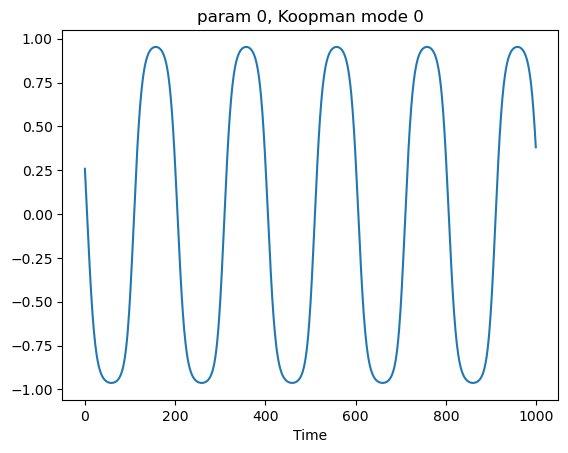

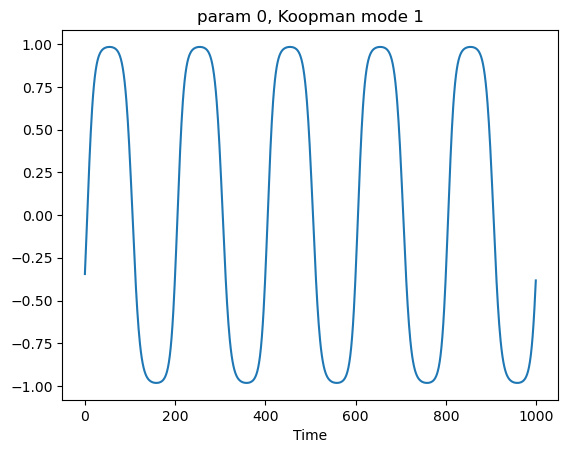

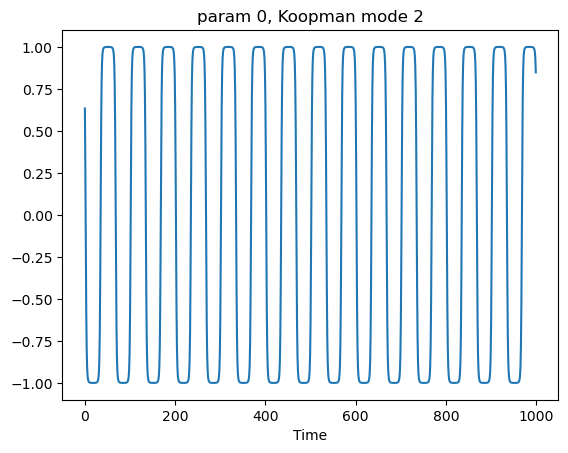

torch.Size([1000, 10])


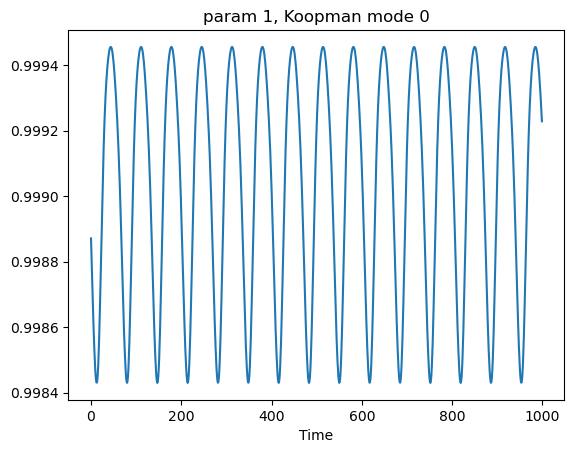

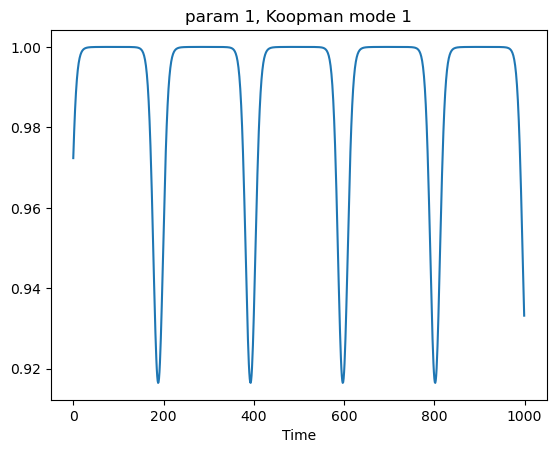

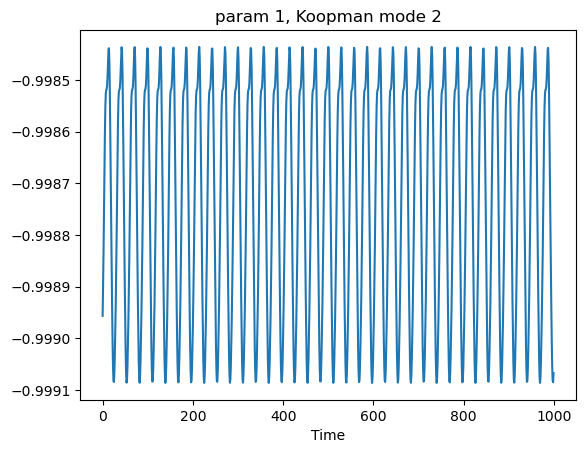

In [45]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, l1_coef=0.1, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75,
                      iterations=1000, plot_n_last=1000)

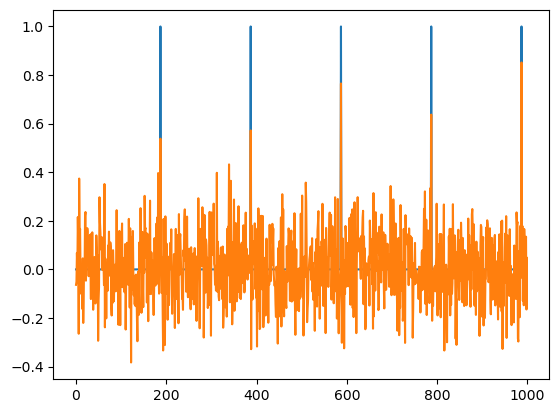

In [7]:
time_series_mu = gen_unit_impulse(10000, 50)
plt.plot(time_series_mu[-1000:])
time_series = add_gaus_noise(time_series_mu, sigma=0.2).reshape(-1,1)
time_series /= time_series.max()
plt.plot(time_series[-1000:])

fourier periods: tensor([4.4458, 2.8571, 3.4949, 2.4728, 8.8028], dtype=torch.float64)
Loss at iteration 10: -1.4424136193696382
Loss at iteration 60: -1.4508938061170595
Loss at iteration 110: -1.454618786772081
Loss at iteration 160: -1.45696459143501
Loss at iteration 210: -1.458382712374394
Loss at iteration 260: -1.4594105192777513
Loss at iteration 310: -1.4602962954417011
Loss at iteration 360: -1.4611268383727123
Loss at iteration 410: -1.4619505711001306
Loss at iteration 460: -1.4627552699009154
Loss at iteration 510: -1.4634522515365966
Loss at iteration 560: -1.4639716456027176
Loss at iteration 610: -1.4643784310335024
Loss at iteration 660: -1.4647378167801426
Loss at iteration 710: -1.4650813641026272
Loss at iteration 760: -1.4654133733309098
Loss at iteration 810: -1.4657326262725743
Loss at iteration 860: -1.4660346468995518
Loss at iteration 910: -1.4663251606408103
Loss at iteration 960: -1.46658952926614
Final loss: -1.4667961176201867


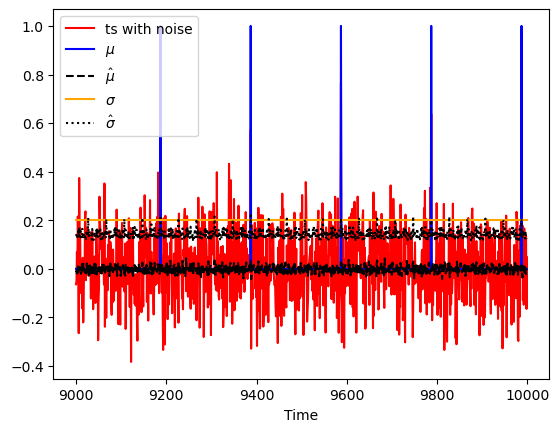

torch.Size([1000, 10])


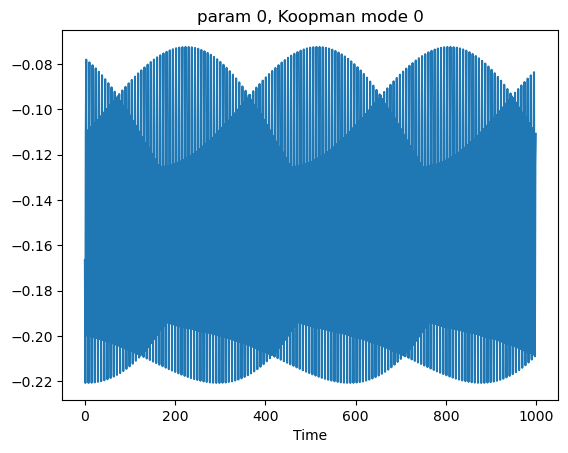

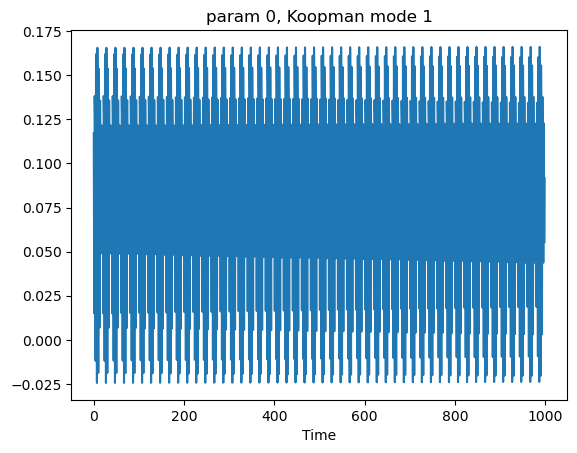

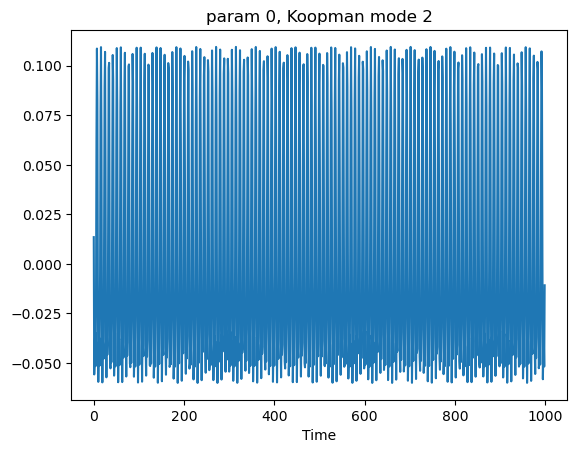

torch.Size([1000, 10])


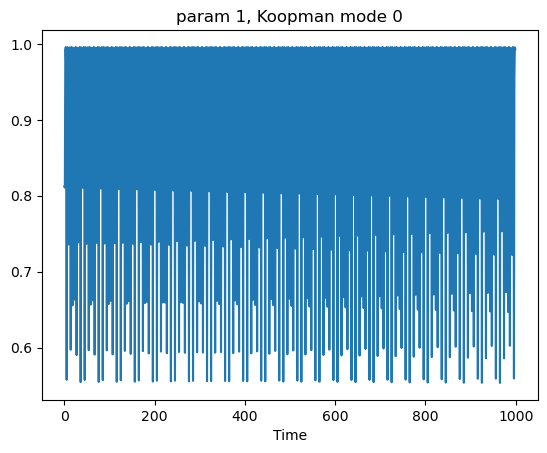

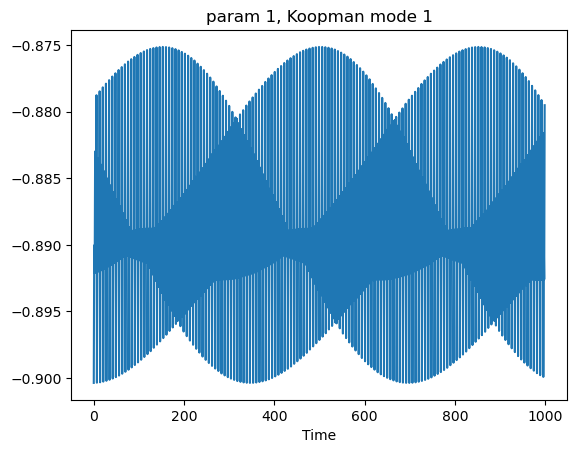

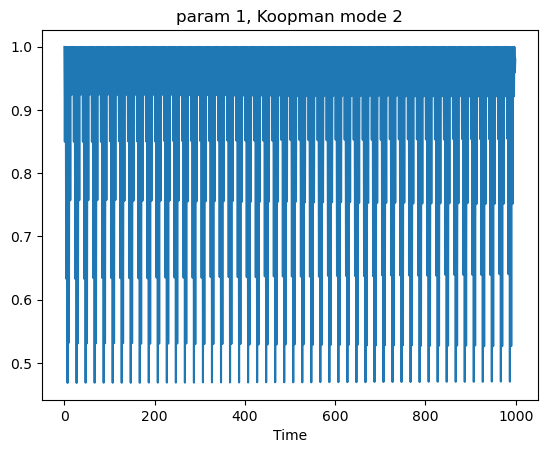

In [9]:
# plt.plot(time_series[-1000:])
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.2, num_modes=3, train_ratio=0.75,
                      iterations=1000, plot_n_last=1000)

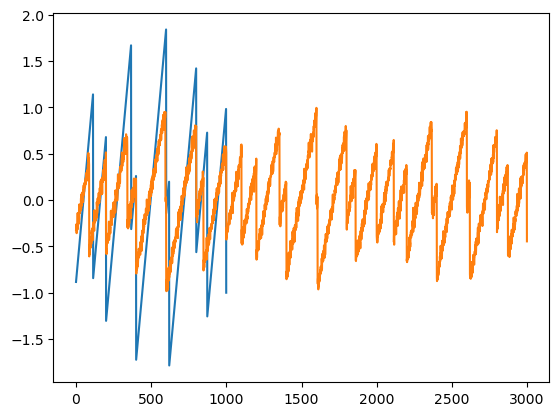

In [11]:
# t = np.linspace(0, 100, 10000)
time_series_mu = gen_sawtooth(10000, 50) + gen_sawtooth(10000, 0.79*50)
# time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-1000:])
time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)
time_series /= time_series.max()

plt.plot(time_series[-3000:])

fourier periods: tensor([202.7027, 258.6207, 127.1186, 101.3514,  66.9643], dtype=torch.float64)
Loss at iteration 10: -1.1036125498425322
Loss at iteration 60: -0.978074165599417
Loss at iteration 110: -0.8936102059186393
Loss at iteration 160: -1.0596711310651312
Loss at iteration 210: -0.9085985830706613
Loss at iteration 260: -0.9986702195425682
Loss at iteration 310: -1.0647127492170798
Loss at iteration 360: -1.1128723870162234
Loss at iteration 410: -0.6057413457600437
Loss at iteration 460: -1.041804102241827
Final loss: -1.089945380811541


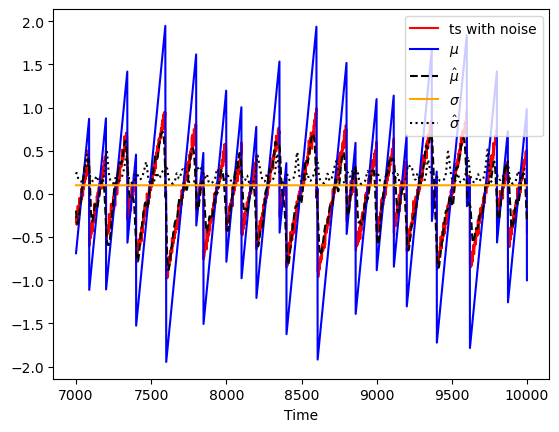

torch.Size([3000, 10])


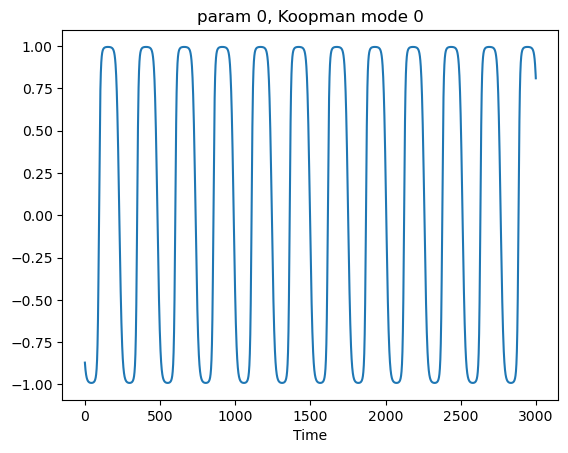

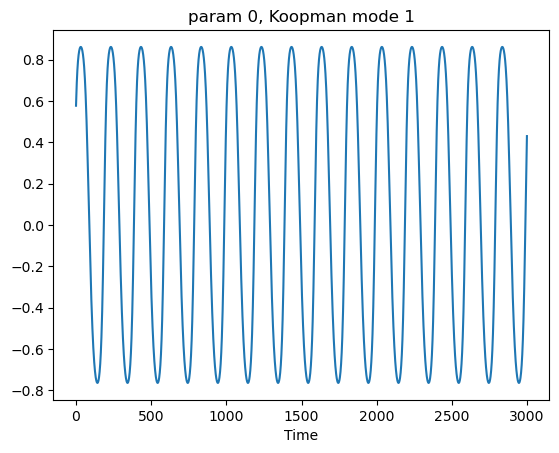

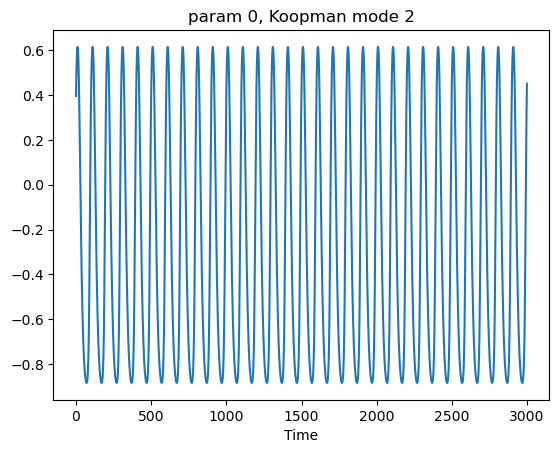

torch.Size([3000, 10])


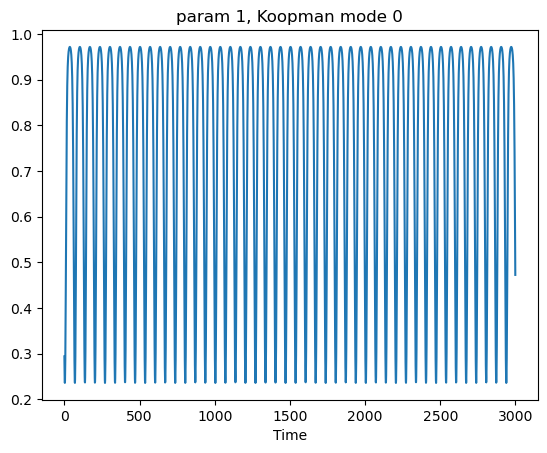

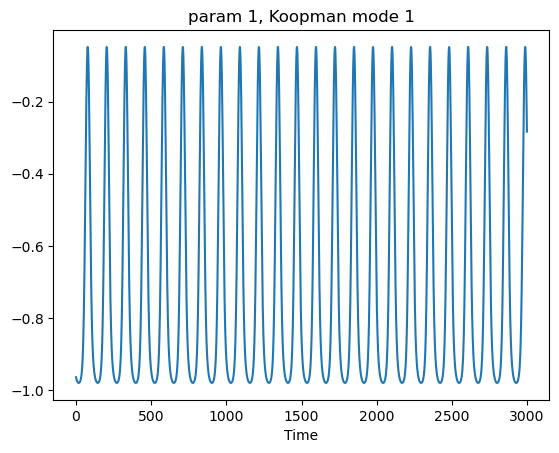

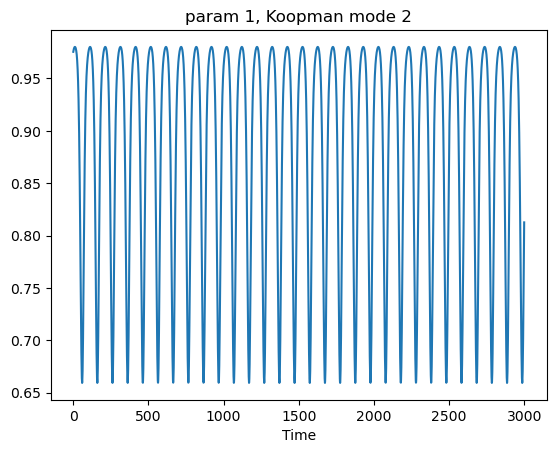

In [12]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.1, num_modes=3, train_ratio=0.75,
                      iterations=500, plot_n_last=3000)

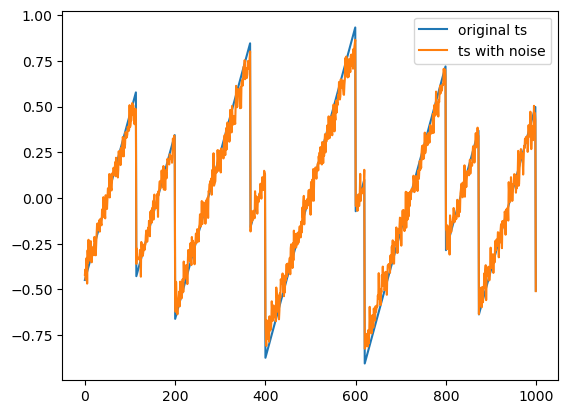

In [7]:
time_series_mu = gen_sawtooth(10000, 50) + gen_sawtooth(10000, 0.79*50)
time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)
time_series /= time_series.max()
time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-1000:], label='original ts')
plt.plot(time_series[-1000:], label='ts with noise')
plt.legend();

fourier periods: tensor([202.7027, 258.6207, 127.1186, 100.0000,  66.9643], dtype=torch.float64)
Loss at iteration 10: -0.12248657149261775
Loss at iteration 60: -0.6340211807073093
Loss at iteration 110: -0.6024694112124895
Loss at iteration 160: -0.7261831389571188
Loss at iteration 210: -0.7914923963124794
Loss at iteration 260: -0.5132263460651549
Loss at iteration 310: -0.6760894205235192
Loss at iteration 360: -0.6264071959112282
Loss at iteration 410: -0.6902688819456234
Loss at iteration 460: -0.6636796067343502
Final loss: -0.4489123129843528


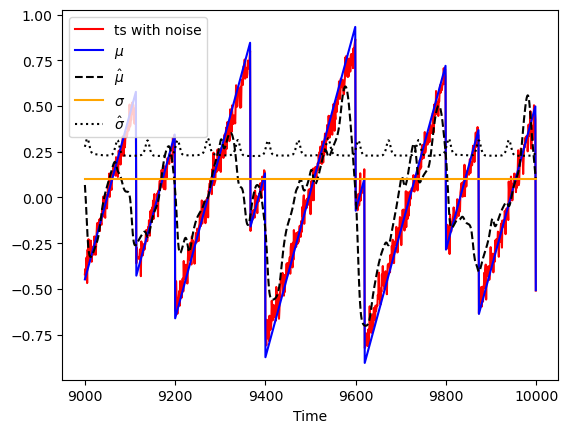

torch.Size([1000, 10])


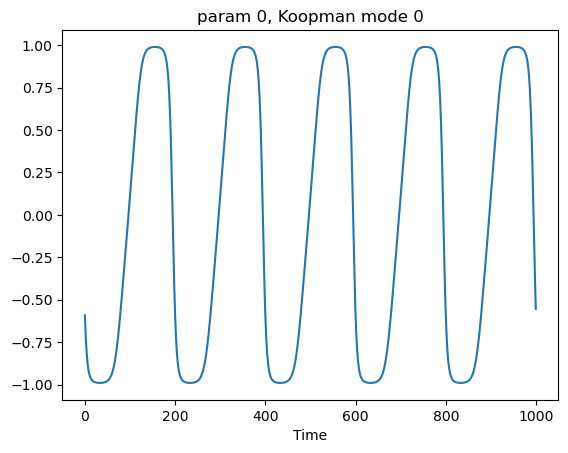

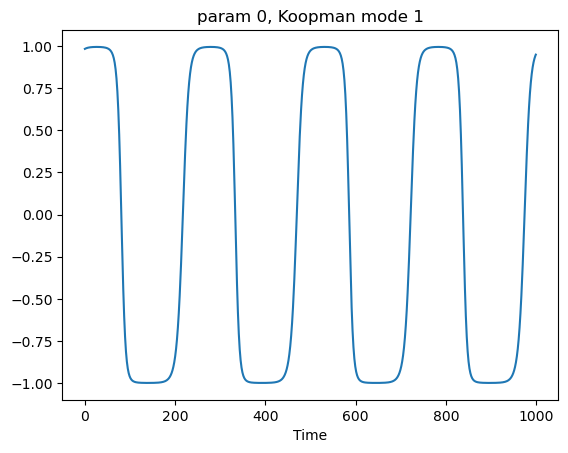

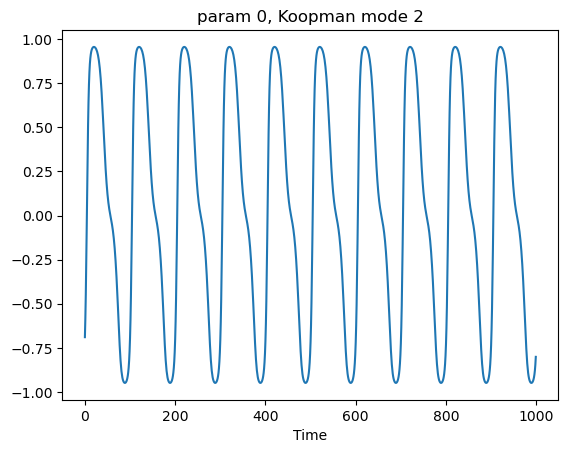

torch.Size([1000, 10])


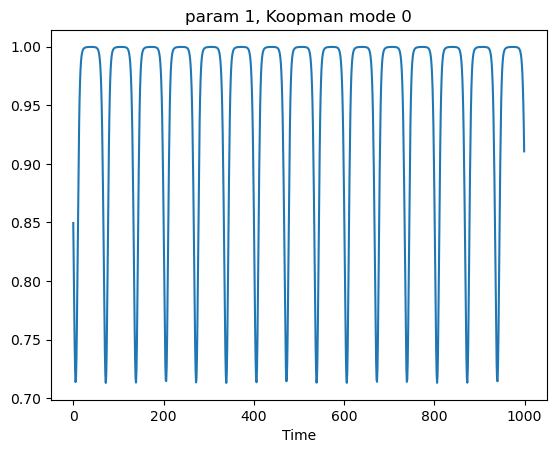

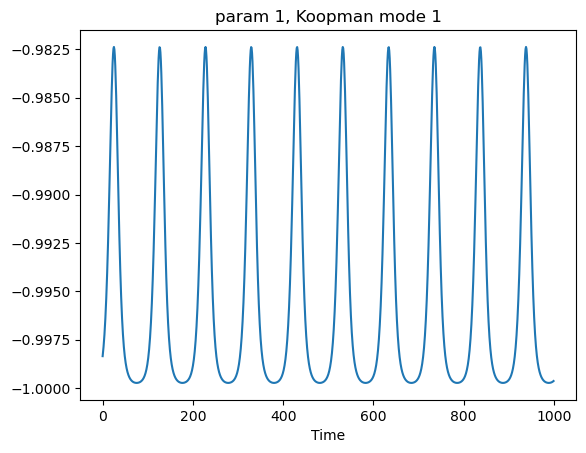

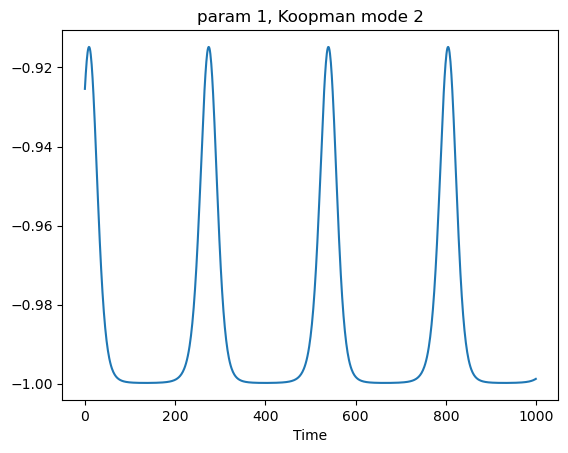

In [8]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, l1_coef=0.1, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.1, num_modes=3, train_ratio=0.75,
                      iterations=500, plot_n_last=1000)

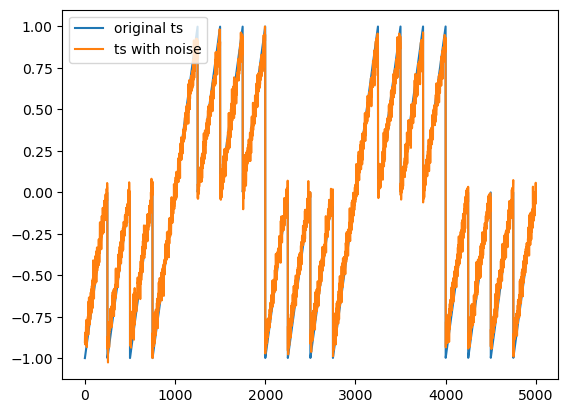

In [21]:
time_series_mu = gen_squares(10000, 5) + gen_sawtooth(10000, 40)
time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)
time_series /= time_series.max()

time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-5000:], label='original ts')
plt.plot(time_series[-5000:], label='ts with noise')
plt.legend();

fourier periods: tensor([2500.0000, 1875.0000,  258.6207, 3750.0000,  750.0000],
       dtype=torch.float64)
Loss at iteration 10: -0.29663415719617003
Loss at iteration 60: -0.6113800358128046
Loss at iteration 110: -0.6390177947940173
Loss at iteration 160: -0.6459150964976742
Loss at iteration 210: -0.5339443736707198
Loss at iteration 260: -0.30125258657061066
Loss at iteration 310: -0.6164122528023714
Loss at iteration 360: -0.41917999579657694
Loss at iteration 410: -0.36492910900886516
Loss at iteration 460: -0.6532296045065992
Loss at iteration 510: -0.48596682329397706
Loss at iteration 560: -0.5154208230487912
Loss at iteration 610: -0.5539410359022632
Loss at iteration 660: -0.42056981302423213
Loss at iteration 710: -0.3952344396434064
Loss at iteration 760: -0.55132556764047
Loss at iteration 810: -0.3563726412205789
Loss at iteration 860: -0.5478949051651097
Loss at iteration 910: -0.23847239389090585
Loss at iteration 960: -0.41805145856673215
Final loss: -0.430147330532

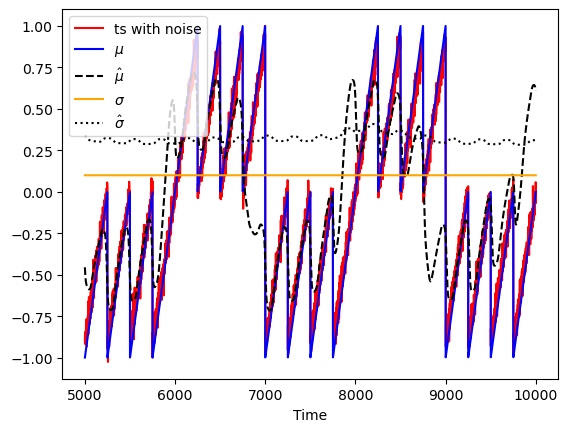

torch.Size([5000, 10])


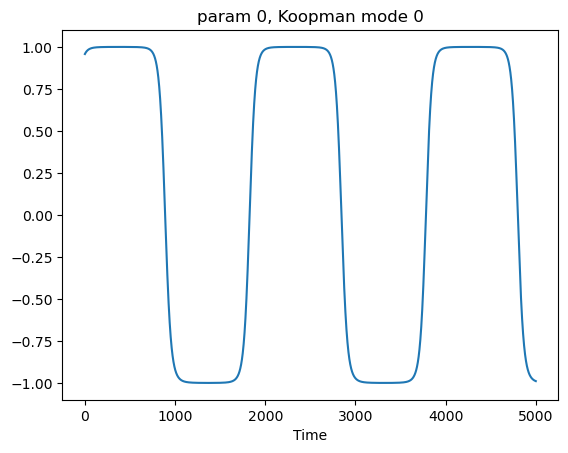

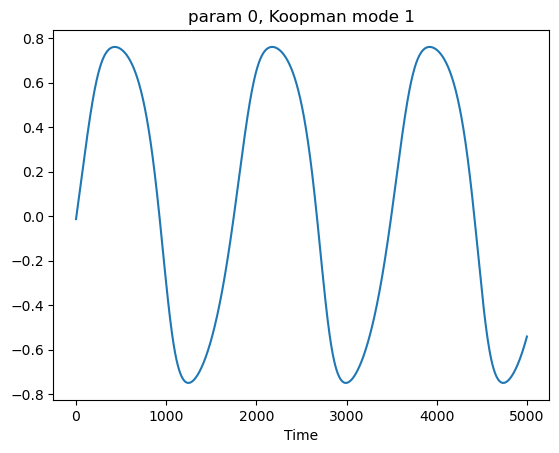

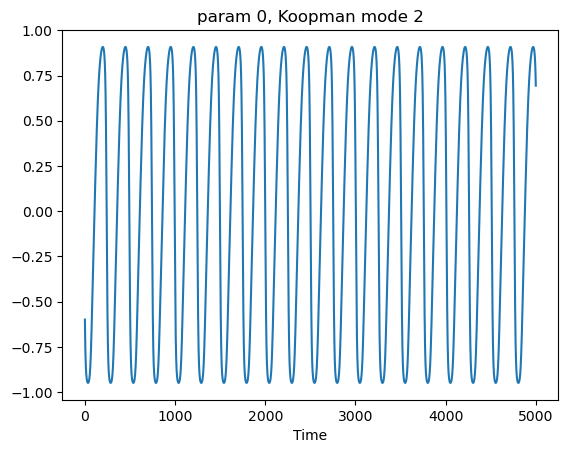

torch.Size([5000, 10])


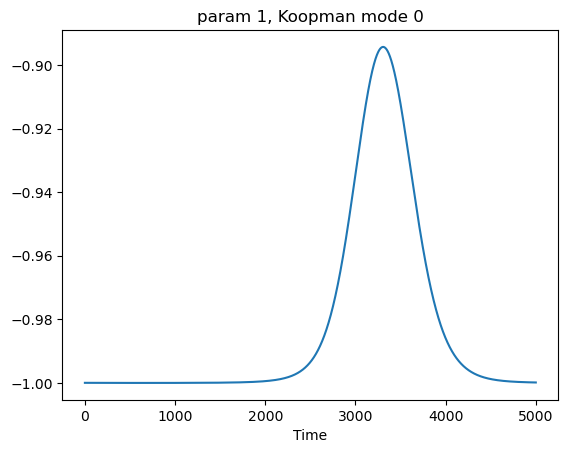

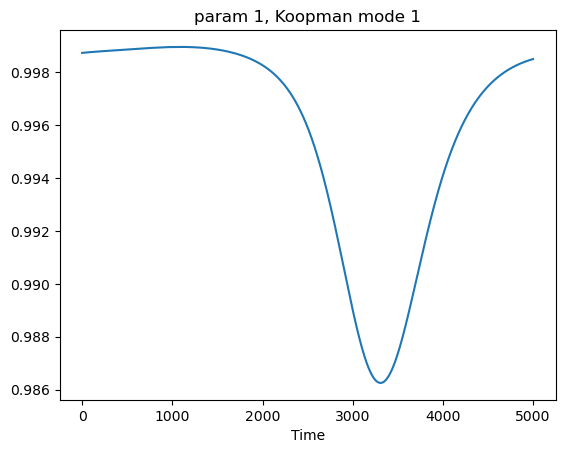

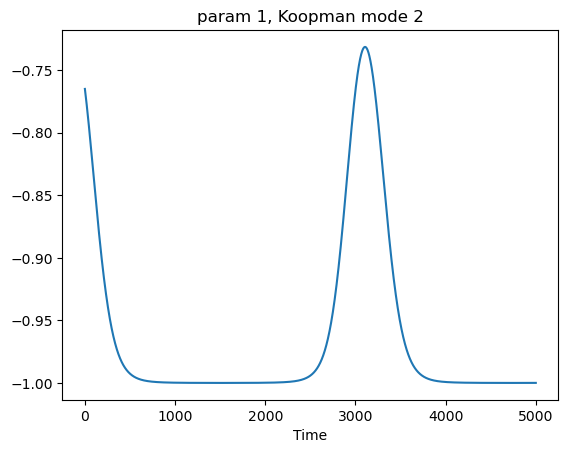

In [22]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, l1_coef=0.05, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.1, num_modes=3, train_ratio=0.75, iterations=1000, plot_n_last=5000)

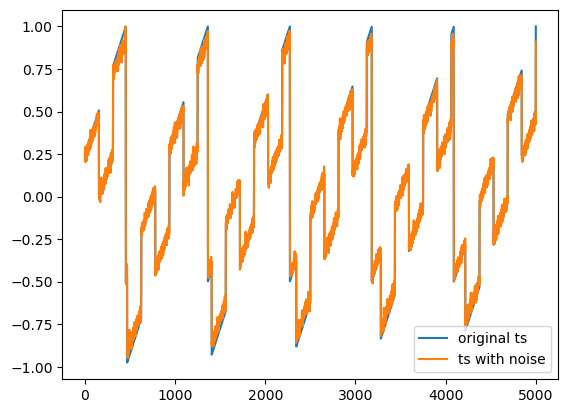

In [50]:
time_series_mu = 3*gen_sawtooth(10000, 11) + gen_squares(10000, 32)
time_series = add_gaus_noise(time_series_mu, sigma=0.1).reshape(-1,1)
time_series /= time_series.max()

time_series_mu /= time_series_mu.max()
plt.plot(time_series_mu[-5000:], label='original ts')
plt.plot(time_series[-5000:], label='ts with noise')
plt.legend();

fourier periods: tensor([ 937.5000, 1071.4286,  312.5000,  468.7500,  833.3333],
       dtype=torch.float64)
Loss at iteration 10: -0.09976953733125962
Loss at iteration 60: -0.6426759126059409
Loss at iteration 110: -0.5064492170880509
Loss at iteration 160: -0.6513838555264001
Loss at iteration 210: -0.7125694008564989
Loss at iteration 260: -0.4514595681028831
Loss at iteration 310: -0.46946579869472066
Loss at iteration 360: -0.43802903194959286
Loss at iteration 410: -0.4549460988442892
Loss at iteration 460: -0.4805767641517618
Loss at iteration 510: -0.528700285640198
Loss at iteration 560: -0.528904353690913
Loss at iteration 610: -0.3931028928191664
Loss at iteration 660: -0.44641804520261974
Loss at iteration 710: -0.5519389139096351
Loss at iteration 760: -0.4341687833905297
Loss at iteration 810: -0.42610013952886616
Loss at iteration 860: -0.3501950279890414
Loss at iteration 910: -0.43213081896673694
Loss at iteration 960: -0.44557939475865044
Final loss: -0.4172311491934

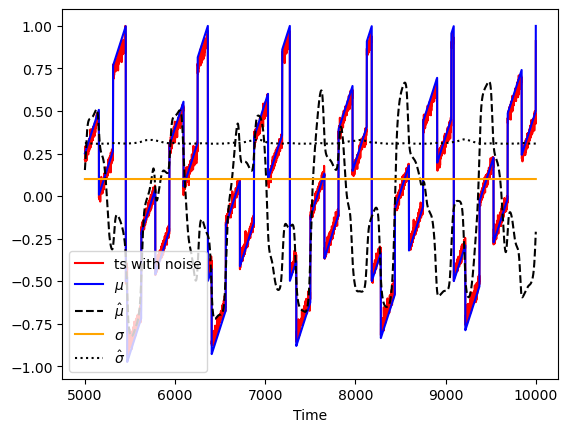

torch.Size([5000, 10])


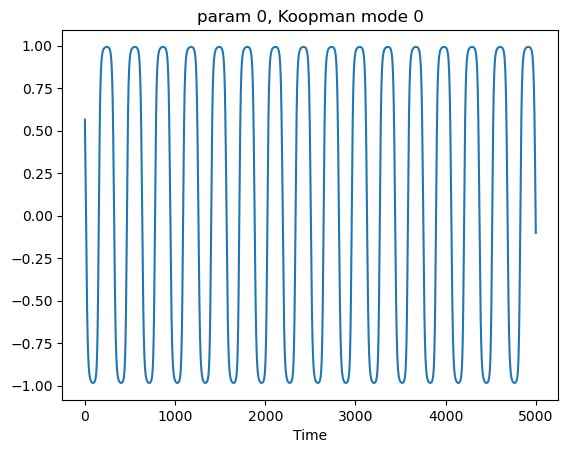

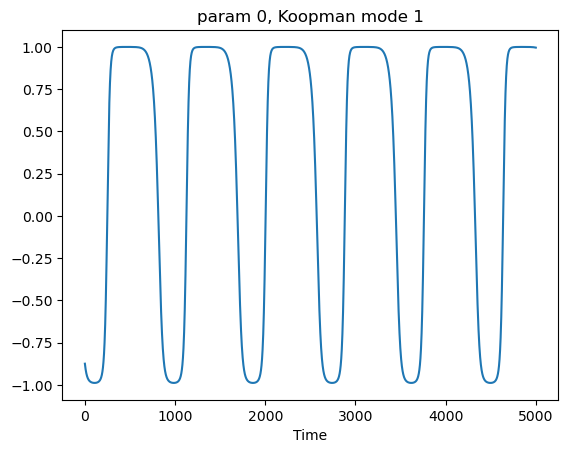

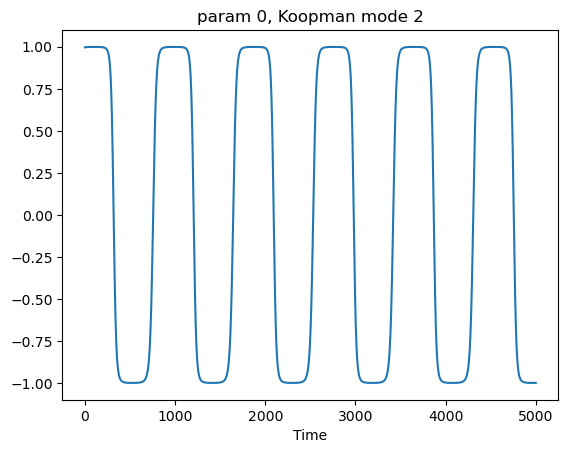

torch.Size([5000, 10])


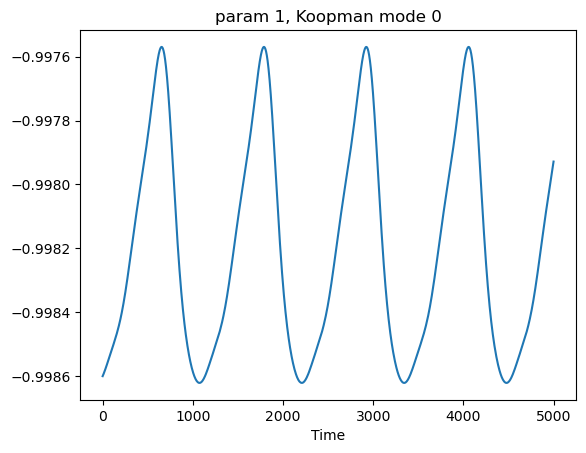

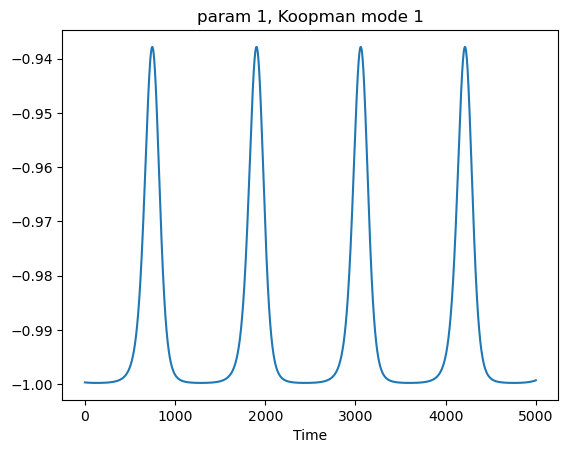

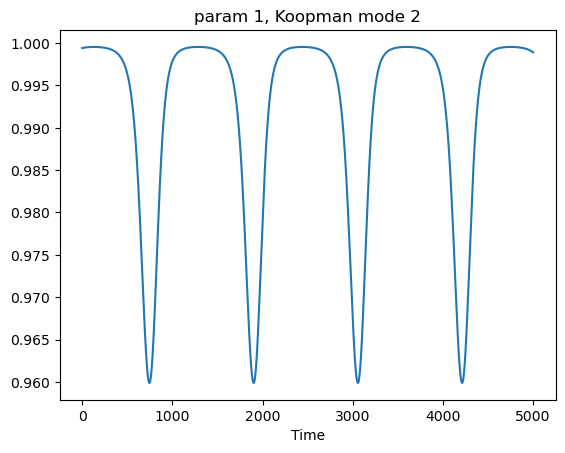

In [51]:
num_freqs = [5, 5]
num_fourier = 5
model2 = MultiNormalNLL(num_freqs=num_freqs, x_dim=1)
k2 = CoordinateKoopmanProb(model2, device='cpu', sample_num=24, num_fourier_modes=num_fourier, l1_coef=0.08, batch_size=32)

k2.find_fourier_omegas(time_series[:7500])
plot_modes_stochastic(10000, time_series, time_series_mu, k2, sigma_true=.1, num_modes=3, train_ratio=0.75, iterations=1000, plot_n_last=5000)